/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_17380/1038907391.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.Method.iloc[3]='rankN'


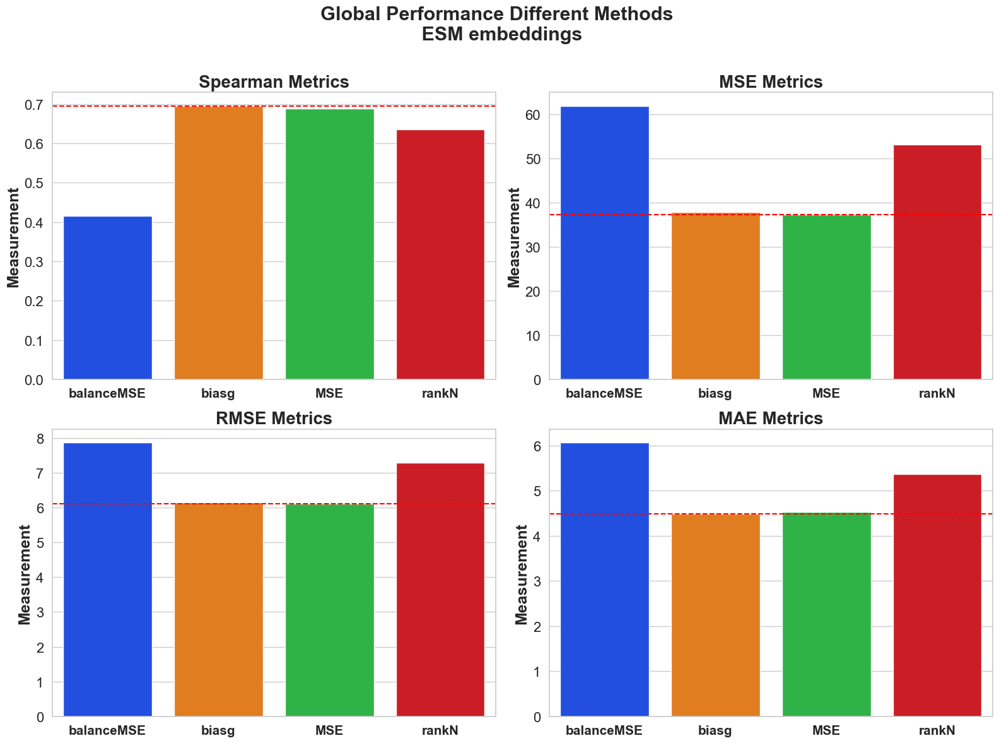

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_barplots_from_excel(file_path, global_title = "'Comparison of Methods by Different Metrics'"):
    """
    This function reads metric data from an Excel file and creates a 2x2 grid of bar plots to compare different methods.
    It also adds a dashed red line to highlight the highest value for Spearman and the lowest values for the other metrics.
    
    Parameters:
    - file_path (str): The path to the Excel file containing the metric data.
    
    Returns:
    - None
    """
    # Read the Excel file into a DataFrame
    df = pd.read_excel(file_path, index_col=0)
    #df = df.sort_values(by='Name', ascending=False)
    # Reset the index to have 'Method' as a column
    df.reset_index(inplace=True)

    # Rename the columns for clarity
    df.columns = ['Method', 'global_Spearman', 'global_MSE', 'global_RMSE', 'global_MAE']
    df = df.sort_values(by='Method', key=lambda x: x.str.lower())
    
    # Set the style for the plots
    sns.set(style="whitegrid")

    # Create subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Define metrics
    metrics = ['global_Spearman', 'global_MSE', 'global_RMSE', 'global_MAE']
    titles = ['Spearman Metrics', 'MSE Metrics', 'RMSE Metrics', 'MAE Metrics']

    # Define colors
    #colors = sns.color_palette("Set2")
    colors = sns.color_palette("bright")
    df.Method.iloc[3]='rankN'

    # Plot each metric in a separate subplot
    for i, (metric, title) in enumerate(zip(metrics, titles)):
        row, col = divmod(i, 2)
        sns.barplot(data=df, x='Method', y=metric, ax=axes[row, col], palette=colors)
        axes[row, col].set_title(title, fontsize=20, fontweight='bold')
        axes[row, col].set_xlabel('')
        axes[row, col].set_ylabel('Value', fontsize=16)
        axes[row, col].tick_params(axis='x', labelsize=16)
        axes[row, col].tick_params(axis='y', labelsize=16)
        #axes[row, col].set_xlabel('Methods', fontsize=18, fontweight='bold')
        axes[row, col].set_ylabel('Measurement', fontsize=18, fontweight='bold')
        axes[row, col].set_xticklabels( [ ii.split('_')[0] for ii in df.Method] ,  ha='center', fontsize=15, weight='bold' )

        
        # Add a dashed red line for the highest value of Spearman and the lowest for the others
        if metric == 'global_Spearman':
            max_value = df[metric].max()
            axes[row, col].axhline(max_value, linestyle='--', color='red')
        else:
            min_value = df[metric].min()
            axes[row, col].axhline(min_value, linestyle='--', color='red')

    # Adjust layout
    fig.suptitle(global_title, fontsize=22,  fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    
    # Save the plot to a file
    plt.savefig('scientific_style_plot.png')

# Example usage
file_path = 'global.xlsx'  # Replace with your actual file path
plot_barplots_from_excel(file_path, global_title="Global Performance Different Methods \n ESM embeddings")


In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def loading_preprocessing_imbalanceRatio():
    # Read the Excel file related to balance ratio per datasets
    col_imbalance = ['organism','weight']
    trainset_imbalance = pd.read_excel('trainset_dist.xlsx').sort_values(by='organisms').reset_index(drop=True)
    trainset_imbalance['count']=trainset_imbalance['count']/trainset_imbalance['count'].sum()
    testset_imbalance = pd.read_excel('testset_dist.xlsx').sort_values(by='organisms').reset_index(drop=True)
    testset_imbalance['count']=testset_imbalance['count']/testset_imbalance['count'].sum()
    valset_imbalance = pd.read_excel('valset_dist.xlsx').sort_values(by='organisms').reset_index(drop=True)
    testset_imbalance['count']=valset_imbalance['count']/valset_imbalance['count'].sum()
    trainset_imbalance.columns = col_imbalance
    testset_imbalance.columns = col_imbalance
    valset_imbalance.columns = col_imbalance
    trainset_imbalance.loc[len(trainset_imbalance.index)] = ['TOTAL', trainset_imbalance['weight'].sum()]
    testset_imbalance.loc[len(testset_imbalance.index)] = ['TOTAL', testset_imbalance['weight'].sum()]
    valset_imbalance.loc[len(valset_imbalance.index)] = ['TOTAL', valset_imbalance['weight'].sum()]
    return trainset_imbalance, testset_imbalance, valset_imbalance

def weighted_mean(df, organism, weights):
        return (df[organism] * df[weights]).sum() / df[weights].sum()


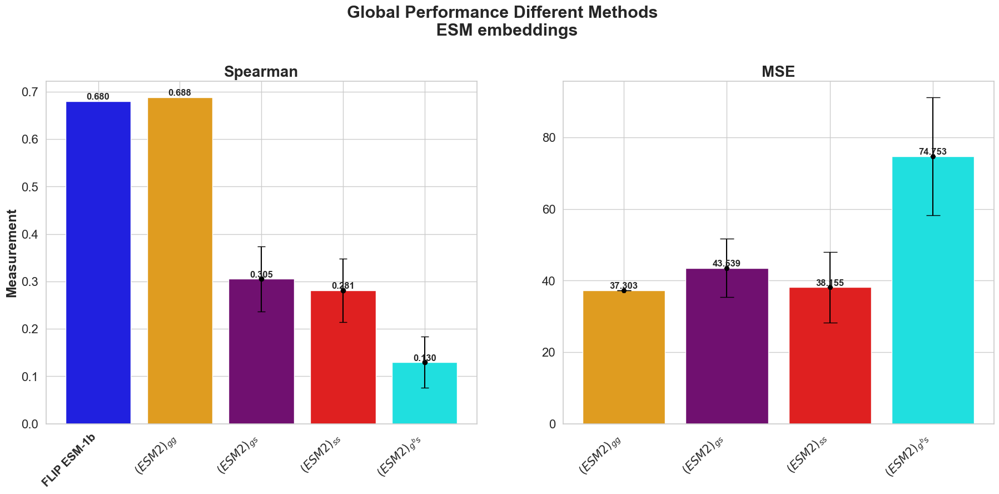

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_barplots_for_preprint_global(file_path_global, file_path_gspecies, file_path_species, global_title="Comparison of Methods by Different Metrics"):

    # Read the Excel file related to balance ratio per datasets
    trainset_ir, testset_ir, valset_ir = loading_preprocessing_imbalanceRatio()

    # Read the Excel file into a DataFrame
    df = pd.read_excel(file_path_global, sheet_name='ESM_only')
    df_gspec = pd.read_excel(file_path_gspecies, sheet_name='ESM_only')
    df_gspec['weights'] = testset_ir['weight']
    df_spec = pd.read_excel(file_path_species, sheet_name='ESM_only')
    df_spec['weights'] = testset_ir['weight']

    df.rename(columns={'Unnamed: 0': 'Method'}, inplace=True)
    df_gspec.rename(columns={'Unnamed: 0': 'Method'}, inplace=True)
    df_spec.rename(columns={'Unnamed: 0': 'Method'}, inplace=True)

    # Set the style for the plots
    sns.set(style="whitegrid")
    mean_species_Spearman = df_spec.MSE_Spearman.iloc[0:25].mean()
    std_species_Spearman = df_spec.MSE_Spearman.iloc[0:25].std()
    mean_species_MSE = df_spec.MSE_MSE.iloc[0:25].mean()
    std_species_MSE = df_spec.MSE_MSE.iloc[0:25].std()

    #categories_Spearman = ['FLIP ESM-1b', 'ESM2-LA', 'Global-Species', 'Spec-Species', 'Balancing-Batch']
    #categories_MSE = ['ESM2-LA', 'Global-Species', 'Spec-Species', 'Balancing-Batch']
    categories_Spearman = ['FLIP ESM-1b', r'$(ESM2)_{gg}$', r'$(ESM2)_{gs}$', r'$(ESM2)_{ss}$', r'$(ESM2)_{g^{b}s}$']
    categories_MSE = [r'$(ESM2)_{gg}$', r'$(ESM2)_{gs}$', r'$(ESM2)_{ss}$', r'$(ESM2)_{g^{b}s}$']

    vals_barplot_global_vs_FLIP_Spearman = [
        0.68, 
        df.global_Spearman[df.Method == 'MSE'].item(), 
        df_gspec['MSE_Spearman'].iloc[0:25].mean(),
        df_spec['MSE_Spearman'].iloc[0:25].mean(),
        df_gspec['balanceMSE_Spearman'].iloc[0:25].mean()
    ]

    vals_barplot_global_vs_FLIP_MSE = [
        df.global_MSE[df.Method == 'MSE'].item(), 
        df_gspec['MSE_MSE'].iloc[0:25].mean(),
        df_spec['MSE_MSE'].iloc[0:25].mean(),
        df_gspec['balanceMSE_MSE'].iloc[0:25].mean()
    ]

    # Calculate means and standard errors
    errors_Spearman = [
                        0, 0, 
                        df_gspec['MSE_Spearman'].iloc[0:25].std() / np.sqrt(25),
                        df_spec['MSE_Spearman'].iloc[0:25].std() / np.sqrt(25),
                        df_gspec['balanceMSE_Spearman'].iloc[0:25].std() / np.sqrt(25)
                          ] # Standard error of the mean Spearman
    # Calculate means and standard errors
    errors_MSE = [
                        0, 
                        df_gspec['MSE_MSE'].iloc[0:25].std() / np.sqrt(25),
                        df_spec['MSE_MSE'].iloc[0:25].std() / np.sqrt(25),
                        df_gspec['balanceMSE_MSE'].iloc[0:25].std() / np.sqrt(25)
                          ] # Standard error of the mean Spearman

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(22, 8))

    # Define colors for consistency
    colorsb1 = ['blue', 'orange', 'purple', 'red', 'cyan']
    colorsb2 = ['orange', 'purple', 'red', 'cyan']

    # Spearman bar plot
    sns.barplot(x=categories_Spearman, y=vals_barplot_global_vs_FLIP_Spearman, ax=axes[0], palette=colorsb1)
    axes[0].set_title('Spearman', fontsize=20, fontweight='bold')
    axes[0].set_xlabel('')
    axes[0].set_ylabel('Value', fontsize=16)
    axes[0].tick_params(axis='x', labelsize=16)
    axes[0].tick_params(axis='y', labelsize=16)
    axes[0].set_ylabel('Measurement', fontsize=18, fontweight='bold')
    axes[0].set_xticklabels(categories_Spearman, rotation=45, ha='right', fontsize=15, fontweight='bold')

    # Adding value labels for Spearman
    for i, value in enumerate(vals_barplot_global_vs_FLIP_Spearman):
        axes[0].text(i, value, f'{value:.3f}', ha='center', va='bottom', fontweight='bold')
    # Add selective error bars using Matplotlib
    for i, (meanx, err) in enumerate(zip(vals_barplot_global_vs_FLIP_Spearman, errors_Spearman )):
        if err > 0:  # Only add error bars where error is greater than 0
            axes[0].errorbar(i, meanx, yerr=err, fmt='o', color='black', capsize=5)


    
    # Adding grid to the y-axis for Spearman
    axes[0].grid(True, which='major', axis='x')

    # MSE bar plot
    sns.barplot(x=categories_MSE, y=vals_barplot_global_vs_FLIP_MSE, ax=axes[1], palette=colorsb2)
    axes[1].set_title('MSE', fontsize=20, fontweight='bold')
    axes[1].set_xlabel('' )
    #axes[1].set_ylabel('Value', fontsize=16)
    axes[1].tick_params(axis='x', labelsize=16)
    axes[1].tick_params(axis='y', labelsize=16)
    #axes[1].set_ylabel('Measurement', fontsize=18, fontweight='bold')
    axes[1].set_xticklabels(categories_MSE, rotation=45, ha='right', fontsize=15, fontweight='bold')

    # Adding value labels for MSE
    for i, value in enumerate(vals_barplot_global_vs_FLIP_MSE):
        axes[1].text(i, value, f'{value:.3f}', ha='center', va='bottom', fontweight='bold')
    # Add selective error bars using Matplotlib
    for i, (meanxx, errx) in enumerate(zip(vals_barplot_global_vs_FLIP_MSE, errors_MSE )):
        if err > 0:  # Only add error bars where error is greater than 0
            axes[1].errorbar(i, meanxx, yerr=errx, fmt='H', color='black', capsize=9)

    # Adding grid to the y-axis for Spearman
    axes[1].grid(True, which='major', axis='x')

    # Adjust layout
    fig.suptitle(global_title, fontsize=22, fontweight='bold', y=1.05)
    plt.subplots_adjust(wspace=0.2)  # Adjust the wspace parameter to add separation between plots
    #plt.tight_layout(rect=[0.0, 0.0, 1, 0.97])
    plt.savefig('Fig1_global_perf_barplot.pdf', bbox_inches='tight', pad_inches=0.1)
    plt.show()
    plt.close()



plot_barplots_for_preprint_global('global.xlsx', 'global_species.xlsx', 'spec_species.xlsx', global_title="Global Performance Different Methods \n ESM embeddings")


# ________________________________________________________________________________________________

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# Step 1: Read the Excel file

def plot_violins_just_MSE_gspecies_sspecies(file_path_gs, file_path_ss, 
                                               sheet_name, desired_method='MSE'):
    df_gs = pd.read_excel(file_path_gs, sheet_name=sheet_name).iloc[0:25]
    df_ss = pd.read_excel(file_path_ss, sheet_name=sheet_name).iloc[0:25]
    
    df_gs = df_gs[[ f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE' ]]
    
    df_gs.columns = [ 'gsMSE_Spearman', 'gsMSE_MSE', 
                      'gsMSE_RMSE', 'gsMSE_MAE' ]
    
    df_ss = df_ss[[ f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE' ]]
    df_ss.columns = [ 'ssMSE_Spearman', 'ssMSE_MSE', 
                      'ssMSE_RMSE', 'ssMSE_MAE' ]
    
    desired_mse_columns = ['gsMSE_MSE', 'ssMSE_MSE']
    merged_df = pd.concat([df_gs, df_ss], axis=1)
        
    metrics = ['Spearman', 'MSE', 'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}
    plot_violins_custom_df(merged_df, desired_mse_columns, grouped_columns, metrics, 
                           sheet_name = 'Global vs Specific Species')

def plot_violins_variance_per_sheet(file_path, sheet_name, desired_method='all', title=''):

    df = pd.read_excel(file_path, sheet_name=sheet_name)
    # Step 2: Identify columns for each metric
    # Define the exact columns to be included for MSE
    if desired_method!='all':
        df = df[[ f'{desired_method}_Spearman', f'{desired_method}_MSE', f'{desired_method}_RMSE', f'{desired_method}_MAE' ]]
        desired_mse_columns = [f'{desired_method}_MSE']
    else:
        desired_mse_columns = ['balanceMSE_MSE', 'biasg_MSE', 'MSE_MSE', 'rankN_MSE']
        
    metrics = ['Spearman', 'MSE', 'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}
    plot_violins_custom_df(df, desired_mse_columns, grouped_columns, metrics, sheet_name, title)


def plot_violins_custom_df(df, desired_mse_columns, grouped_columns, metrics, sheet_name, title_fig):
    for column in df.columns:
        for metric in metrics:
            if metric == 'MSE':
                if column in desired_mse_columns:
                    grouped_columns[metric].append(column)
            else:
                if metric in column:
                    grouped_columns[metric].append(column)

    # Step 3: Create subplots for each metric group
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 12), gridspec_kw={'wspace': 0.3, 'hspace': 0.6})
    axes = axes.flatten()
    palette = sns.color_palette("bright", len(grouped_columns))

    # Define grid splits for each metric
    grid_splits = {
        'Spearman': 0.5,
        'MSE': 50,
        'RMSE': 5,
        'MAE': 5
    }

    # Custom boxplot properties
    boxprops = {'edgecolor': 'black', 'linewidth': 2}
    whiskerprops = {'color': 'blue', 'linewidth': 1.5}
    capprops = {'color': 'green', 'linewidth': 2}
    medianprops = {'color': 'red', 'linewidth': 2, 'linestyle': '--'}  # Adding medianprops
    flierprops = {'marker': 'o', 'color': 'orange', 'alpha': 0.5}

    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            
            sns.violinplot(data=df[columns], ax=axes[i], palette=palette, linewidth=4.5, inner="box", 
                        boxprops={'linewidth': 5.5, 'color': 'k'}
                            )
            # Add dashed red line to indicate median value
            median_value = df[columns].median().median()
            axes[i].axhline(y=median_value, color='red', linestyle='--', linewidth=2)
            title_template= f'\n{metric} Means Along Species \n balanceMSE = {df[columns][columns[0]].mean():.3f}       biasg = {df[columns][columns[1]].mean():.3f} \n       MSE = {df[columns][columns[2]].mean():.3f}              rankN = {df[columns][columns[3]].mean():.3f}\n'
            axes[i].set_title(f'{metric}', fontsize=20, fontweight='bold')
            #axes[i].set_xticklabels(columns, rotation=45, ha='right', fontsize=10)
            axes[i].set_xticklabels( [ ii.split('_')[0] for ii in columns] ,  ha='center', fontsize=14, weight='bold' )
            #axes[i].set_xlabel(title_template, fontsize=13, fontweight='bold')
            axes[i].set_ylabel('Measurement', fontsize=17, fontweight='bold')
            
            #axes[i].grid(True, linestyle='--', linewidth=0.7)
            # Customize grid
            axes[i].grid(True, which='both', linestyle='--', linewidth=1.7)
            
            # Set yticks based on the specified grid splits
            ymin, ymax = axes[i].get_ylim()
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            #axes[i].yaxis.set_minor_locator(plt.MultipleLocator(step / 2))
            axes[i].set_yticklabels(axes[i].get_yticks(), fontsize=13, fontweight='bold')

            # Custom xlabel annotation for different font sizes
            x_pos = 0.5
            y_pos = -0.28
            axes[i].annotate(f'\nMeans Along Species\n', xy=(x_pos, y_pos), xycoords='axes fraction', ha='center', fontsize=16, weight='bold')
            axes[i].annotate(f'\n balanceMSE = {df[columns][columns[0]].mean():.3f}       biasg = {df[columns][columns[1]].mean():.3f} \n       MSE = {df[columns][columns[2]].mean():.3f}             rankN = {df[columns][columns[3]].mean():.3f}', xy=(x_pos, y_pos - 0.08), xycoords='axes fraction', ha='center', fontsize=13)

    #plt.tight_layout()
    #plt.subplots_adjust(top=0.95)
    #plt.subplots_adjust(top=0.9)  # Adjust top as needed
    plt.tight_layout()  # Adjust the padding between subplots and figure title
    plt.subplots_adjust(top=0.85, wspace=0.15)  # Adjust top as needed

    #fig.suptitle(' '.join(sheet_name.split('_')), fontsize=18, fontweight='bold')
    fig.suptitle( title_fig, fontsize=22, fontweight='bold')

    plt.show()


file_path = 'global_species.xlsx'
sheets=['ESM_only', 'PiFold_only', 'Both']

"""
plot_violins_just_MSE_gspecies_sspecies(file_path_gs='global_species.xlsx', 
                                        file_path_ss='spec_species.xlsx', 
                                        sheet_name='ESM_only', desired_method='MSE')
"""

#plot_violins_variance_per_sheet('global_species.xlsx', sheets[0], title='Global Species Models Performance - ESM Embeddings \n Methods Comparison')
#plot_violins_variance_per_sheet('global_species.xlsx', sheets[2], title='Global Species Models Performance - ESM + PiFold Embeddings \n Methods Comparison')

#plot_violins_variance_per_sheet('spec_species.xlsx', sheets[2], title='Specific Species Models Performance - ESM + PiFold Embeddings \n Methods Comparison')



"\nplot_violins_just_MSE_gspecies_sspecies(file_path_gs='global_species.xlsx', \n                                        file_path_ss='spec_species.xlsx', \n                                        sheet_name='ESM_only', desired_method='MSE')\n"

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# Step 1: Read the Excel file


def plot_violins_variance_custom_old(file_path, sheet, desired_method='all', title=''):

    df_ESM = pd.read_excel(file_path, sheet_name=sheet[0])
    df_ESM.columns=[ 'ESM_'+ii for ii in df_ESM.columns]

    df_Both = pd.read_excel(file_path, sheet_name=sheet[2])
    df_Both.columns=[ 'ESM_PiFold_'+ii for ii in df_Both.columns]
    df = pd.concat( [df_ESM, df_Both] ,axis=1)

    #df = pd.read_excel(file_path, sheet_name=sheet[0])

    # Step 2: Identify columns for each metric
    # Define the exact columns to be included for MSE
    
     
    metrics = ['Spearman', 'MSE', 'RMSE', 'MAE']
    #metrics = ['Spearman', 'RMSE', 'MAE']

    grouped_columns = {metric: [] for metric in metrics}
    grouped_columns['Spearman']=  ['ESM_MSE_Spearman', 'ESM_balanceMSE_Spearman', 'ESM_PiFold_MSE_Spearman', 'ESM_biasg_Spearman',
                                    'ESM_rankN_Spearman', 'ESM_PiFold_balanceMSE_Spearman', 'ESM_PiFold_biasg_Spearman',
                                    'ESM_PiFold_rankN_Spearman']

    
    grouped_columns['MSE']=  ['ESM_MSE_MSE', 'ESM_balanceMSE_MSE', 'ESM_PiFold_MSE_MSE', 'ESM_biasg_MSE',
                                    'ESM_rankN_MSE', 'ESM_PiFold_balanceMSE_MSE', 'ESM_PiFold_biasg_MSE',
                                    'ESM_PiFold_rankN_MSE']
    
    
    grouped_columns['RMSE']=  ['ESM_MSE_RMSE', 'ESM_balanceMSE_RMSE', 'ESM_PiFold_MSE_RMSE', 'ESM_biasg_RMSE',
                                    'ESM_rankN_RMSE', 'ESM_PiFold_balanceMSE_RMSE', 'ESM_PiFold_biasg_RMSE',
                                    'ESM_PiFold_rankN_RMSE']
    
    grouped_columns['MAE']=  ['ESM_MSE_MAE', 'ESM_balanceMSE_MAE', 'ESM_PiFold_MSE_MAE', 'ESM_biasg_MAE',
                                    'ESM_rankN_MAE', 'ESM_PiFold_balanceMSE_MAE', 'ESM_PiFold_biasg_MAE',
                                    'ESM_PiFold_rankN_MAE']


    # Step 3: Create subplots for each metric group
    #fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(18, 37), gridspec_kw={'wspace': 0.3, 'hspace': 0.6})
    fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(18, 37), gridspec_kw={'wspace': 0.3, 'hspace': 0.6})
    axes = axes.flatten()
    palette = sns.color_palette("bright", 9)

    # Define grid splits for each metric
    grid_splits = {
        'Spearman': 0.5,
        'MSE': 50,
        'RMSE': 5,
        'MAE': 5
    }

    # Custom boxplot properties
    boxprops = {'edgecolor': 'black', 'linewidth': 2}
    whiskerprops = {'color': 'blue', 'linewidth': 1.5}
    capprops = {'color': 'green', 'linewidth': 2}
    medianprops = {'color': 'red', 'linewidth': 2, 'linestyle': '--'}  # Adding medianprops
    flierprops = {'marker': 'o', 'color': 'orange', 'alpha': 0.5}

    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            
            sns.violinplot(data=df[columns], ax=axes[i], palette=palette, linewidth=4.5, inner="box", 
                        boxprops={'linewidth': 5.5, 'color': 'k'}
                            )
            # Add dashed red line to indicate median value
            median_value = df[columns].median().median()
            axes[i].axhline(y=median_value, color='red', linestyle='--', linewidth=2)
            #title_template= f'\n{metric} Means Along Species \n balanceMSE = {df[columns][columns[0]].mean():.3f}       biasg = {df[columns][columns[1]].mean():.3f} \n       MSE = {df[columns][columns[2]].mean():.3f}              rankN = {df[columns][columns[3]].mean():.3f}\n'
            axes[i].set_title(f'{metric}', fontsize=20, fontweight='bold')
            #axes[i].set_xticklabels(columns, rotation=45, ha='right', fontsize=10)
            #axes[i].set_xticklabels( [ ii.split('_')[0] for ii in columns] ,  ha='center', fontsize=14, weight='bold' )
            axes[i].set_xticklabels( [ '\n'.join(ii.split('_')[:-1]) for ii in columns] ,  ha='center', fontsize=14, weight='bold' )
            
            #axes[i].set_xlabel(title_template, fontsize=13, fontweight='bold')
            axes[i].set_ylabel('Measurement', fontsize=17, fontweight='bold')
            
            #axes[i].grid(True, linestyle='--', linewidth=0.7)
            # Customize grid
            axes[i].grid(True, which='both', linestyle='--', linewidth=1.7)
            
            # Set yticks based on the specified grid splits
            ymin, ymax = axes[i].get_ylim()
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            #axes[i].yaxis.set_minor_locator(plt.MultipleLocator(step / 2))
            axes[i].set_yticklabels(axes[i].get_yticks(), fontsize=13, fontweight='bold')

            # Custom xlabel annotation for different font sizes
            x_pos = 0.5
            y_pos = -0.28
            #axes[i].annotate(f'\nMeans Along Species\n', xy=(x_pos, y_pos), xycoords='axes fraction', ha='center', fontsize=16, weight='bold')
            #axes[i].annotate(f'\n balanceMSE = {df[columns][columns[0]].mean():.3f}       biasg = {df[columns][columns[1]].mean():.3f} \n       MSE = {df[columns][columns[2]].mean():.3f}             rankN = {df[columns][columns[3]].mean():.3f}', xy=(x_pos, y_pos - 0.08), xycoords='axes fraction', ha='center', fontsize=13)

    #plt.tight_layout()
    #plt.subplots_adjust(top=0.95)
    #plt.subplots_adjust(top=0.9)  # Adjust top as needed
    plt.tight_layout()  # Adjust the padding between subplots and figure title
    plt.subplots_adjust(top=0.9, wspace=0.15)  # Adjust top as needed

    #fig.suptitle(' '.join(sheet_name.split('_')), fontsize=18, fontweight='bold')
    fig.suptitle( title, fontsize=22, fontweight='bold')

    plt.show()


file_path = 'global_species.xlsx'
sheets=['ESM_only', 'PiFold_only', 'Both']

"""
plot_violins_variance_custom('global_species.xlsx', 
                                sheets, 
                                title='Global Model to Species Performance - ESM \n Methods Comparison')

plot_violins_variance_custom('spec_species.xlsx', 
                                sheets, 
                                title='Specific Model to Species Performance - ESM \n Methods Comparison')
"""

"\nplot_violins_variance_custom('global_species.xlsx', \n                                sheets, \n                                title='Global Model to Species Performance - ESM \n Methods Comparison')\n\nplot_violins_variance_custom('spec_species.xlsx', \n                                sheets, \n                                title='Specific Model to Species Performance - ESM \n Methods Comparison')\n"

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_17380/2848740836.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


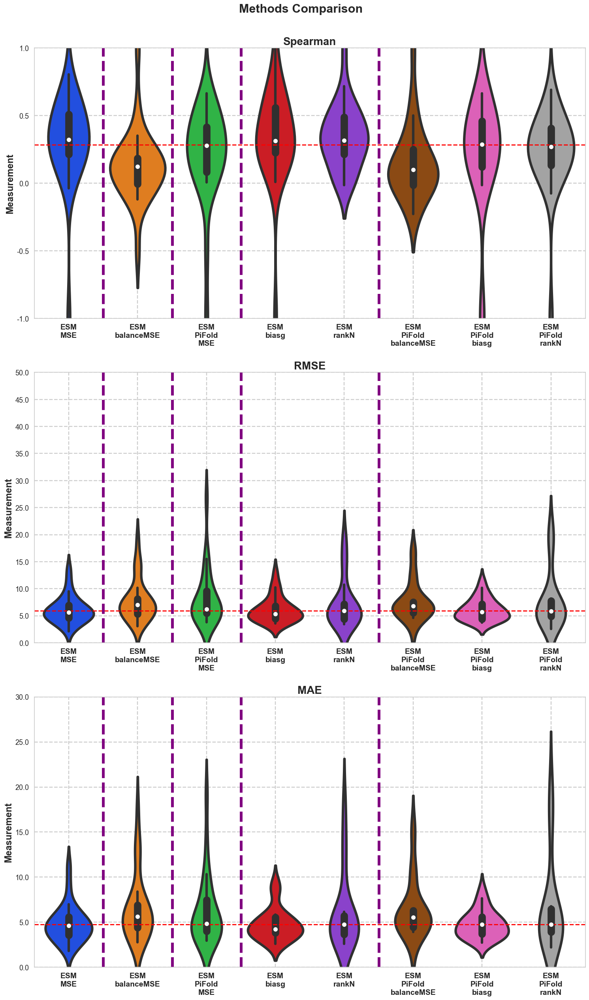

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_17380/2848740836.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


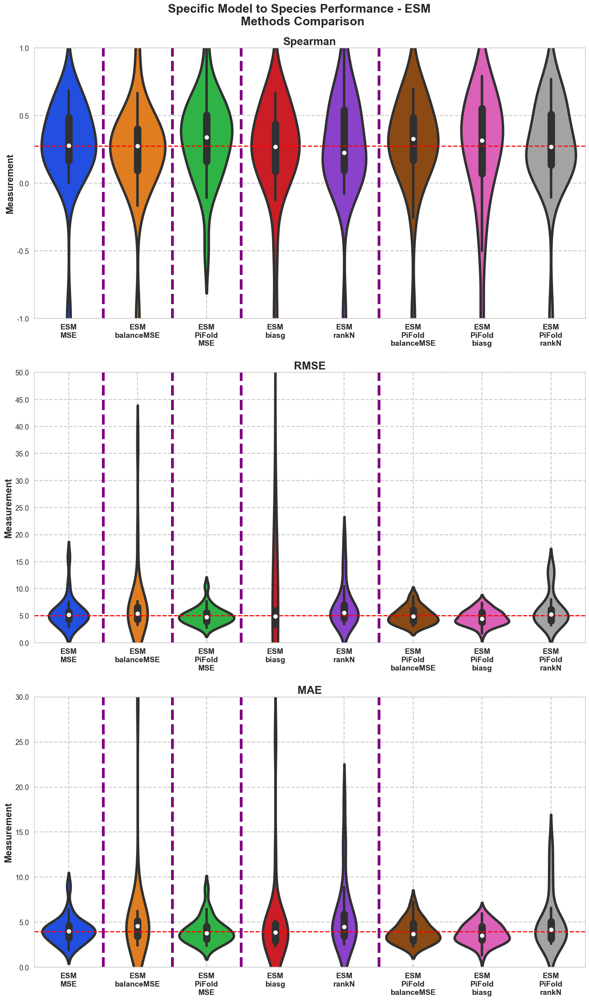

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_violins_variance_custom(file_path, sheet, title='', custom_lines=None, path=''):

    df_ESM = pd.read_excel(file_path, sheet_name=sheet[0])
    df_ESM.columns=[ 'ESM_'+ii for ii in df_ESM.columns]

    df_Both = pd.read_excel(file_path, sheet_name=sheet[2])
    df_Both.columns=[ 'ESM_PiFold_'+ii for ii in df_Both.columns]
    df = pd.concat([df_ESM, df_Both], axis=1)

    metrics = ['Spearman',  'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}
    grouped_columns['Spearman'] = ['ESM_MSE_Spearman', 'ESM_balanceMSE_Spearman', 'ESM_PiFold_MSE_Spearman', 'ESM_biasg_Spearman',
                                   'ESM_rankN_Spearman', 'ESM_PiFold_balanceMSE_Spearman', 'ESM_PiFold_biasg_Spearman',
                                   'ESM_PiFold_rankN_Spearman']

    """grouped_columns['MSE'] = ['ESM_MSE_MSE', 'ESM_balanceMSE_MSE', 'ESM_PiFold_MSE_MSE', 'ESM_biasg_MSE',
                              'ESM_rankN_MSE', 'ESM_PiFold_balanceMSE_MSE', 'ESM_PiFold_biasg_MSE',
                              'ESM_PiFold_rankN_MSE']"""

    grouped_columns['RMSE'] = ['ESM_MSE_RMSE', 'ESM_balanceMSE_RMSE', 'ESM_PiFold_MSE_RMSE', 'ESM_biasg_RMSE',
                               'ESM_rankN_RMSE', 'ESM_PiFold_balanceMSE_RMSE', 'ESM_PiFold_biasg_RMSE',
                               'ESM_PiFold_rankN_RMSE']

    grouped_columns['MAE'] = ['ESM_MSE_MAE', 'ESM_balanceMSE_MAE', 'ESM_PiFold_MSE_MAE', 'ESM_biasg_MAE',
                              'ESM_rankN_MAE', 'ESM_PiFold_balanceMSE_MAE', 'ESM_PiFold_biasg_MAE',
                              'ESM_PiFold_rankN_MAE']

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(18, 28), gridspec_kw={'wspace': 0.3, 'hspace': 0.2})
    axes = axes.flatten()
    palette = sns.color_palette("bright", 9)

    grid_splits = {
        'Spearman': 0.5,
        'MSE': 50,
        'RMSE': 5,
        'MAE': 5
    }

    metrics_y_ranges = {
        'Spearman':[-1,1],
        'RMSE': [0,50],
        'MAE':[0,30]
    }

    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            sns.violinplot(data=df[columns], ax=axes[i], palette=palette, linewidth=4.5, inner="box", 
                           boxprops={'linewidth': 5.5, 'color': 'k'})
            median_value = df[columns].median().median()
            axes[i].axhline(y=median_value, color='red', linestyle='--', linewidth=2)
            axes[i].set_title(f'{metric}', fontsize=20, fontweight='bold')
            axes[i].set_xticklabels(['\n'.join(ii.split('_')[:-1]) for ii in columns], ha='center', fontsize=14, weight='bold')
            axes[i].set_ylabel('Measurement', fontsize=17, fontweight='bold')
            #axes[i].xaxis.grid(True, linestyle='--', linewidth=1.7)
            axes[i].grid(True, linestyle='--', linewidth=1.7)


            ymin, ymax = metrics_y_ranges[metric]#axes[i].get_ylim()
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            axes[i].set_yticklabels(axes[i].get_yticks(), fontsize=13)
            axes[i].set_ylim(ymin,ymax)

            # Add custom dashed lines in the x-axis
            if custom_lines and metric in custom_lines:
                for x in custom_lines[metric]:
                    axes[i].axvline(x=x, color='purple', linestyle='--', linewidth=5)

    plt.tight_layout()
    plt.subplots_adjust(top=0.94, wspace=0.15)
    fig.suptitle(title, fontsize=22, fontweight='bold')
    plt.savefig(path, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    plt.close()



file_path = 'global_species.xlsx'
sheets = ['ESM_only', 'PiFold_only', 'Both']

# Example of custom line positions for each metric
custom_lines = {
    'Spearman': [0.5, 1.5, 2.5, 4.5],
    'MSE': [0.5, 1.5, 2.5, 4.5],
    'RMSE': [0.5, 1.5, 2.5, 4.5],
    'MAE': [0.5, 1.5, 2.5, 4.5]
}

plot_violins_variance_custom(file_path, sheets, 
                             title='Methods Comparison', 
                             custom_lines=custom_lines,
                             path='Fig2_dot_performance_combine_embs_a.pdf')

plot_violins_variance_custom('spec_species.xlsx', 
                                sheets, 
                                title='Specific Model to Species Performance - ESM \n Methods Comparison', 
                                  custom_lines=custom_lines,
                                  path='Fig2_dot_performance_combine_embs_b.pdf')


/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_17380/1195319473.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


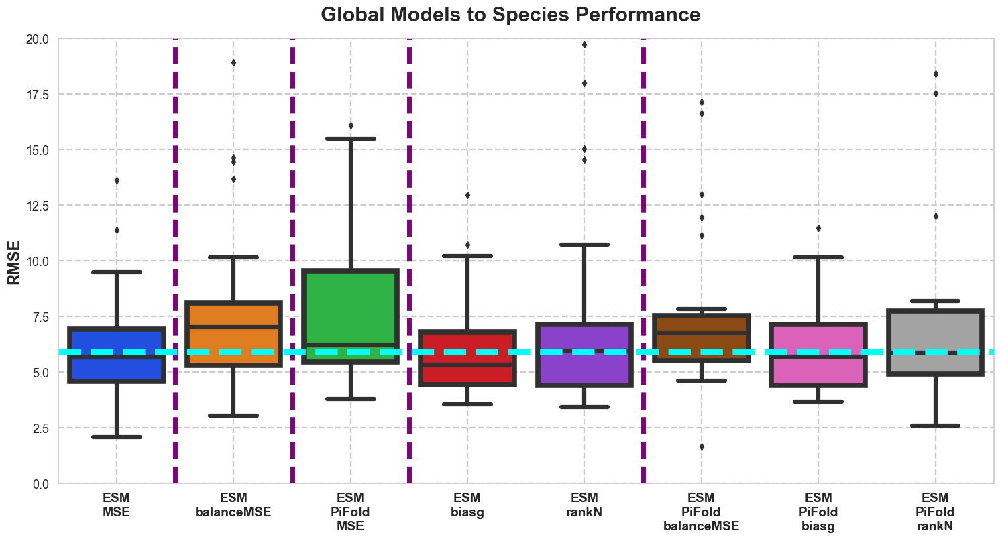

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_17380/1195319473.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


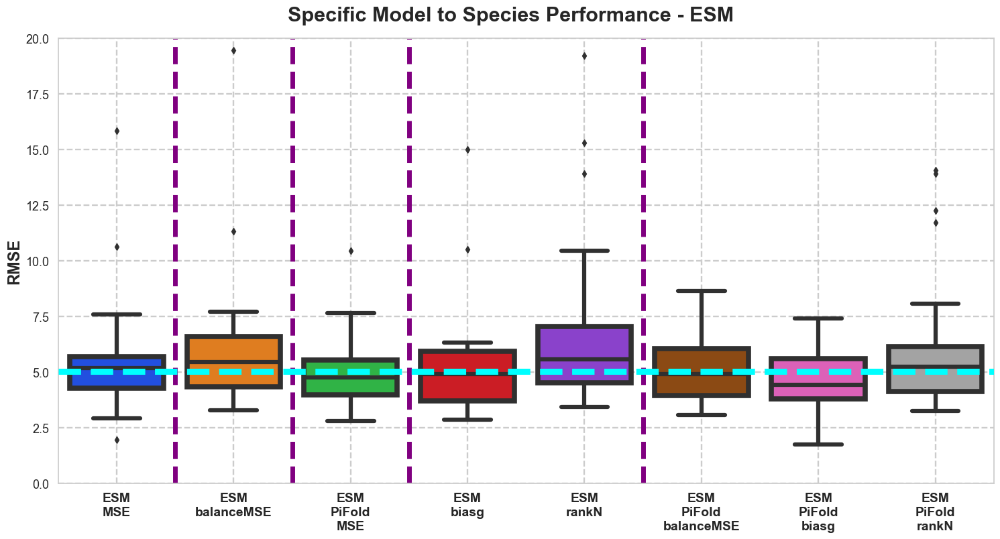

"\nplot_violins_variance_custom_flex('global_species.xlsx', \n                                sheets, \n                                title='Global Models to Species Performance \n Methods Comparison', \n                                  custom_lines=custom_lines,\n                                  path='Fig2_dot_performance_combine_embs_b.pdf',\n                                  selector=['RMSE'],\n                                  strategy='violin')\n\n\nplot_violins_variance_custom_flex('spec_species.xlsx', \n                                sheets, \n                                title='Specific Model to Species Performance - ESM \n Methods Comparison', \n                                  custom_lines=custom_lines,\n                                  path='Fig2_dot_performance_combine_embs_b.pdf',\n                                  selector=['RMSE'],\n                                  strategy='violin')\n\nplot_violins_variance_custom_flex('global_species.xlsx', \n               

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_violins_variance_custom_flex(file_path, sheet, title='', custom_lines=None, path='', 
                                      selector='all', strategy='violin',
                                          metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 200], #[0,150]
                                                        'MAE': [0, 10] #[0,30]
                                                    }
                                                    ):

    df_ESM = pd.read_excel(file_path, sheet_name=sheet[0])
    df_ESM.columns = ['ESM_' + ii for ii in df_ESM.columns]

    df_Both = pd.read_excel(file_path, sheet_name=sheet[2])
    df_Both.columns = ['ESM_PiFold_' + ii for ii in df_Both.columns]
    df = pd.concat([df_ESM, df_Both], axis=1)

    metrics = ['Spearman', 'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}
    grouped_columns['Spearman'] = ['ESM_MSE_Spearman', 'ESM_balanceMSE_Spearman', 'ESM_PiFold_MSE_Spearman', 'ESM_biasg_Spearman',
                                   'ESM_rankN_Spearman', 'ESM_PiFold_balanceMSE_Spearman', 'ESM_PiFold_biasg_Spearman',
                                   'ESM_PiFold_rankN_Spearman']

    grouped_columns['RMSE'] = ['ESM_MSE_RMSE', 'ESM_balanceMSE_RMSE', 'ESM_PiFold_MSE_RMSE', 'ESM_biasg_RMSE',
                               'ESM_rankN_RMSE', 'ESM_PiFold_balanceMSE_RMSE', 'ESM_PiFold_biasg_RMSE',
                               'ESM_PiFold_rankN_RMSE']

    grouped_columns['MAE'] = ['ESM_MSE_MAE', 'ESM_balanceMSE_MAE', 'ESM_PiFold_MSE_MAE', 'ESM_biasg_MAE',
                              'ESM_rankN_MAE', 'ESM_PiFold_balanceMSE_MAE', 'ESM_PiFold_biasg_MAE',
                              'ESM_PiFold_rankN_MAE']

    # Filter grouped_columns based on the selector
    if selector != 'all':
        selected_metrics = selector if isinstance(selector, list) else [selector]
        grouped_columns = {metric: columns for metric, columns in grouped_columns.items() if metric in selected_metrics}

    # Determine the number of metrics to plot
    num_metrics = len(grouped_columns)

    # Create a dynamic number of subplots based on the number of metrics
    fig, axes = plt.subplots(nrows=num_metrics, ncols=1, figsize=(18, 8 * num_metrics), gridspec_kw={'wspace': 0.3, 'hspace': 0.2})
    if num_metrics == 1:
        axes = [axes]

    palette = sns.color_palette("bright", 9)

    grid_splits = {
        'Spearman': 0.5,
        'RMSE': 2.5,
        'MAE': 2.5
    }

    ##metrics_y_ranges = {
    #    'Spearman': [-1, 1],
    #    'RMSE': [0, 150], #[0,20]
    #    'MAE': [0, 30] #[0,10]
    #}

    seaborn_method = {
        'boxplot':sns.boxplot,
        'violin': sns.violinplot
    }

    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            
            #sns.violinplot(data=df[columns], ax=axes[i], palette=palette, linewidth=4.5, inner="box",
            seaborn_method[strategy](data=df[columns], ax=axes[i], palette=palette, linewidth=4.5, #inner="box", 
                           boxprops={'linewidth': 5.5})
            median_value = df[columns].median().median()
            #axes[i].axhline(y=median_value, color='cyan', linestyle='--', linewidth=4.5)
            #axes[i].set_title(f'{metric}', fontsize=20, fontweight='bold')
            axes[i].set_xticklabels(['\n'.join(ii.split('_')[:-1]) for ii in columns], ha='center', fontsize=14, weight='bold')
            axes[i].set_ylabel(f'{metric}', fontsize=17, fontweight='bold')
            axes[i].grid(True, linestyle='--', linewidth=1.7)

            ymin, ymax = metrics_y_ranges[metric]
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            axes[i].set_yticklabels(axes[i].get_yticks(), fontsize=13)
            axes[i].set_ylim(ymin, ymax)


            # Add custom dashed lines in the x-axis
            if custom_lines and metric in custom_lines:
                for x in custom_lines[metric]:
                    axes[i].axvline(x=x, color='purple', linestyle='--', linewidth=5)

            axes[i].axhline(y=median_value, color='cyan', linestyle='--', linewidth=6.5, zorder=10)


    plt.tight_layout()
    plt.subplots_adjust(top=0.94, wspace=0.15)
    fig.suptitle(title, fontsize=22, fontweight='bold', y=1.)
    plt.savefig(path, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    plt.close()


plot_violins_variance_custom_flex('global_species.xlsx', 
                                sheets, 
                                title='Global Models to Species Performance', 
                                  custom_lines=custom_lines,
                                  path='Fig3_boxplot_performance_Allgs.pdf',
                                  selector=['RMSE'],
                                  strategy='boxplot',
                                  metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 20], #[0,20]
                                                        'MAE': [0, 10] #[0,10]
                                                    })

plot_violins_variance_custom_flex('spec_species.xlsx', 
                                sheets, 
                                title='Specific Model to Species Performance - ESM', 
                                  custom_lines=custom_lines,
                                  path='Fig3_boxplot_performance_Allss.pdf',
                                  selector=['RMSE'],
                                  strategy='boxplot',
                                  metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 20], #[0,20]
                                                        'MAE': [0, 10] #[0,10]
                                                    })


"""
plot_violins_variance_custom_flex('global_species.xlsx', 
                                sheets, 
                                title='Global Models to Species Performance \n Methods Comparison', 
                                  custom_lines=custom_lines,
                                  path='Fig2_dot_performance_combine_embs_b.pdf',
                                  selector=['RMSE'],
                                  strategy='violin')


plot_violins_variance_custom_flex('spec_species.xlsx', 
                                sheets, 
                                title='Specific Model to Species Performance - ESM \n Methods Comparison', 
                                  custom_lines=custom_lines,
                                  path='Fig2_dot_performance_combine_embs_b.pdf',
                                  selector=['RMSE'],
                                  strategy='violin')

plot_violins_variance_custom_flex('global_species.xlsx', 
                                sheets, 
                                title='Global Models to Species Performance \n Methods Comparison', 
                                  custom_lines=custom_lines,
                                  path='Fig2_dot_performance_combine_embs_b.pdf',
                                  selector=['RMSE'],
                                  strategy='boxplot')

plot_violins_variance_custom_flex('spec_species.xlsx', 
                                sheets, 
                                title='Specific Model to Species Performance - ESM \n Methods Comparison', 
                                  custom_lines=custom_lines,
                                  path='Fig2_dot_performance_combine_embs_b.pdf',
                                  selector=['RMSE'],
                                  strategy='boxplot')
"""

# -------------------------------------------------------------------------------------------------

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_metrics(file_path_gs, file_path_ss, 
                 sheet_name='ESM_only', desired_method="MSE",
                 title_plot='Line Plots of Different Metrics by Algorithm'):
    # Step 1: Read the Excel file
    #df = pd.read_excel(file_path)

    # Ensure the DataFrame only contains numeric data
    #df = df.select_dtypes(include=[np.number])

    # Remove rows with any negative values


    df_gs = pd.read_excel(file_path_gs, sheet_name=sheet_name).iloc[0:25]
    df_ss = pd.read_excel(file_path_ss, sheet_name=sheet_name).iloc[0:25]
    
    df_gs = df_gs[[ 'Unnamed: 0', f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE' ]]
    
    df_gs.columns = [ 'organisms', 'gsMSE_Spearman', 'gsMSE_MSE', 
                      'gsMSE_RMSE', 'gsMSE_MAE' ]
    
    df_ss = df_ss[[ f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE' ]]
    df_ss.columns = [ 'ssMSE_Spearman', 'ssMSE_MSE', 
                      'ssMSE_RMSE', 'ssMSE_MAE' ]
    
    merged_df = pd.concat([df_gs, df_ss], axis=1)
    #df = merged_df[(merged_df >= 0).all(axis=1)]
    df = merged_df

    # Step 2: Identify columns for each metric
    # Define the exact columns to be included for MSE
    desired_mse_columns = ['gsMSE_MSE', 'ssMSE_MSE']
    metrics = ['Spearman', 'MSE', 'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}

    for column in df.columns:
        for metric in metrics:
            if metric == 'MSE':
                if column in desired_mse_columns:
                    grouped_columns[metric].append(column)
            else:
                if metric in column:
                    grouped_columns[metric].append(column)

    # Sort columns alphabetically regardless of case
    for metric in grouped_columns:
        grouped_columns[metric] = sorted(grouped_columns[metric], key=str.lower)

    # Step 3: Create subplots for each metric group
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(22, 12))
    axes = axes.flatten()

    # Define grid splits for each metric
    grid_splits = {
        'Spearman': 0.2,
        'MSE': 50,
        'RMSE': 2.5,
        'MAE': 1.5
    }

    # Use the magma palette
    handles, labels = [], []
    palette = sns.color_palette("magma", len(grouped_columns))

    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            for column in columns:
                line = sns.lineplot(
                    data=df, x=df.index, y=column, ax=axes[i], marker='o', linestyle='--', linewidth=2.5,
                label=column)
                axes[i].scatter(data=df, x=df.index, y=column, marker='o', color='red',label="_nolegend_", s=50)

                h, l = line.get_legend_handles_labels()
                handles.extend(h)
                labels.extend(l)

            axes[i].set_title(f'{metric} Metrics\n Mean gs={df[columns[0]].mean():.3f} vs Mean ss={df[columns[1]].mean():.3f}', fontsize=14, fontweight='bold')
            axes[i].set_xticks(range(len(df)))
            axes[i].set_xticklabels(df.index, fontsize=10)

            # Add legend outside the plot
            #axes[i].legend(columns, bbox_to_anchor=(1.05, 1))#, loc='upper left')

            # Customize grid
            axes[i].grid(True, which='both', linestyle='--', linewidth=0.9)

            # Set yticks based on the specified grid splits
            ymin, ymax = axes[i].get_ylim()
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            axes[i].yaxis.set_minor_locator(plt.MultipleLocator(step / 2))
            axes[i].set_xlabel('Organisms', fontsize=12, fontweight='bold')
            axes[i].set_ylabel('Measurement', fontsize=12, fontweight='bold')

    # Add a single unified legend
    #fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=len(grouped_columns))

    plt.tight_layout(rect=[0, 0, 0.55, 0.8])  # Adjust right side space for textbox
    #plt.subplots_adjust(top=0.99, right=0.9) 
    # Create textbox with all organisms
    zip_list = zip(df.index.tolist(),df['organisms'].tolist())
    categories_tax= [f"{index} : {value}" for index, value in zip_list]
    textbox_text = '\n'.join(categories_tax)
    
    #props = dict(boxstyle="round", facecolor="white", edgecolor="gray", alpha=0.7, pad=0.05)  # White background, black edge
    #text_box = fig.text(0.82, 0.5, textbox_text, ha='left', va='center', wrap=True, fontsize=13, bbox=props)
    # Create a rectangle with adjusted width behind the text box
    textbox_width = 0.6  # Adjust width as needed
    text_rect = plt.Rectangle(xy=(0.58 - textbox_width / 2 , 0.01),
                              width=textbox_width, height=1,
                              color='none', zorder=0.9)  # Set zorder to be behind text
    fig.add_artist(text_rect)

    # Position each text item manually
    props = dict(boxstyle="round", facecolor="white", edgecolor="gray", alpha=0.7)
    fig.text(0.9, 0.5, "", ha='left', va='center', wrap=True, fontsize=13, bbox=props)  # Empty box to reserve space
    
    title_text = "Organisms List"

    # Split and color the text
    start_y = 0.95
    step_y = -0.03

    # Position the title at the beginning
    fig.text(0.9 - textbox_width / 2 + 0.01, start_y, title_text, ha='left', va='center', fontsize=16, color='black', fontweight='bold')

    # Adjust start_y to position subsequent items below the title
    start_y += step_y   
    import random
    organism_color = 'black'
    random_colors = plt.cm.get_cmap('plasma', 20)
    for i, (index, organism) in enumerate(zip(df.index, df['organisms'])):
        random_color = random_colors(random.random())#random.choice(random_colors)
        fig.text(0.9 - textbox_width / 2 + 0.01, start_y + step_y * i, str(index)+':', ha='left', va='center', fontsize=13, color=random_color, fontweight='bold')
        fig.text(0.9 - textbox_width / 2 + 0.03, start_y + step_y * i, f"{organism}", ha='left', va='center', fontsize=13, color=organism_color)


    #fig.legend(df.index, labels=df.organisms, loc="upper left", bbox_to_anchor=(1.05, 1))  # Adjust location as needed
    plt.subplots_adjust(top=0.87)
    fig.suptitle(title_plot, x=0.3, fontsize=18, fontweight='bold')
    plt.show()

"""
file_path = 'global_species.xlsx'
plot_metrics('global_species.xlsx','spec_species.xlsx', sheet_name='ESM_only', desired_method='MSE',
             title_plot='Global Model vs Specific Species Performance - ESM Embeddings\n Single Loss')

plot_metrics('global_species.xlsx','spec_species.xlsx', sheet_name='Both', desired_method='MSE',
             title_plot='Global Model vs Specific Species Performance - ESM + PiFold Embeddings\n Single Loss')
"""

"\nfile_path = 'global_species.xlsx'\nplot_metrics('global_species.xlsx','spec_species.xlsx', sheet_name='ESM_only', desired_method='MSE',\n             title_plot='Global Model vs Specific Species Performance - ESM Embeddings\n Single Loss')\n\nplot_metrics('global_species.xlsx','spec_species.xlsx', sheet_name='Both', desired_method='MSE',\n             title_plot='Global Model vs Specific Species Performance - ESM + PiFold Embeddings\n Single Loss')\n"

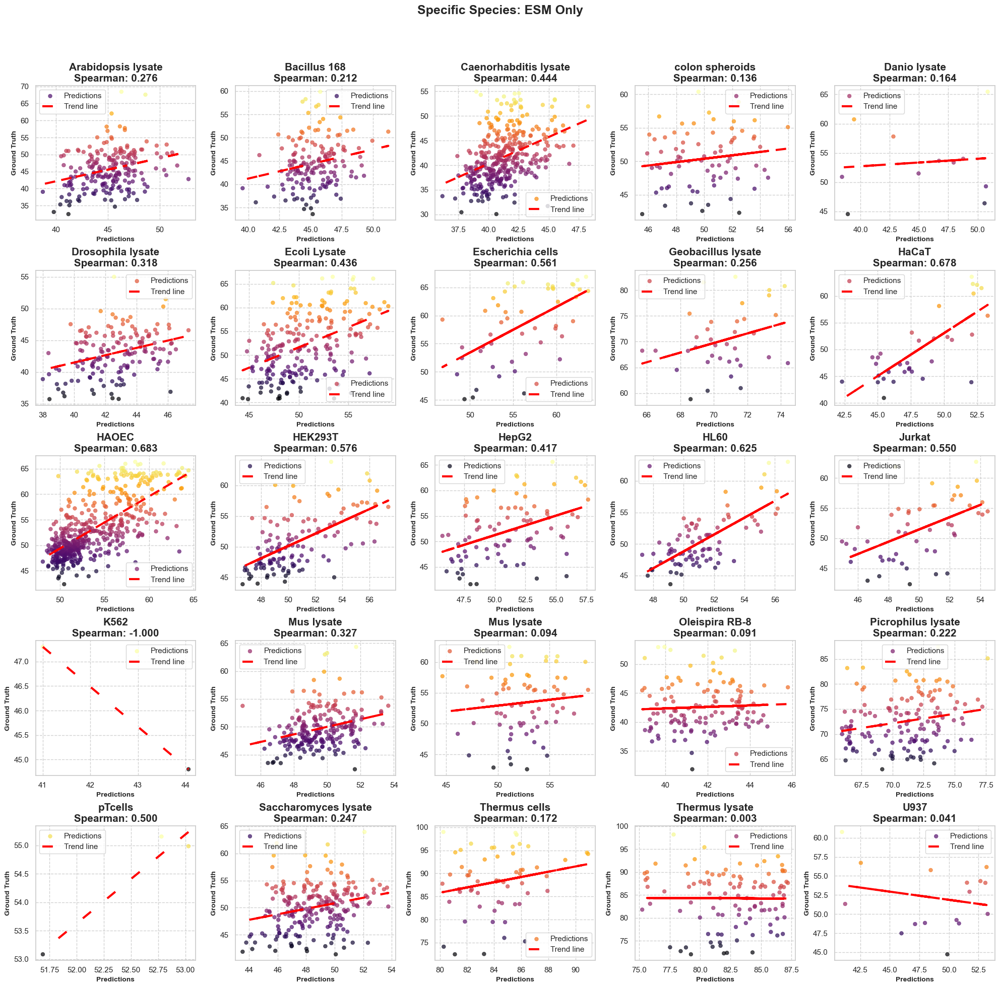

In [24]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr

def mask_name(ss):
    tokens_ss = ss.split('_')

    if len(tokens_ss)<=3:
        masked_name = ' '.join(tokens_ss[:-1])
    else: 
        if len(tokens_ss)==5: idx_complement = 3
        else: idx_complement = 2
        tmp = tokens_ss[:-1]
        masked_name = ' '.join( [ tmp[ii] for ii in [0, idx_complement]] )
    return masked_name

def create_scatter_plot(file_path, ax):
    # Load the data from a TXT file
    #print(f"Reading data from {file_path}")
    data = pd.read_csv(file_path, sep='\t')  # Assuming the data is tab-separated
    #print(data.head())
    # Filter out rows with any negative values
    spearman_corr, _ = spearmanr(data['pred'], data['true'])
    data = data[(data >= 0).all(axis=1)]

    # Create a scatter plot using Matplotlib on the provided axes
    scatter = ax.scatter(data['pred'], data['true'], c=data['true'], cmap='inferno', s=30, alpha=0.7, linewidth=0.5, label='Predictions')

    # Perform a linear regression to get the trend line
    x_reshaped = data['pred'].values.reshape(-1, 1)
    y_reshaped = data['true'].values.reshape(-1, 1)
    regressor = LinearRegression()
    regressor.fit(x_reshaped, y_reshaped)

    # Plot the linear regression line on the scatter plot
    y_pred = regressor.predict(x_reshaped)
    ax.plot(data['pred'], y_pred, color='red',  linestyle=(0, (5, 10)), linewidth=3, label='Trend line')

    # Add labels, title, and legend
    ax.set_xlabel('Predictions', fontsize=10, fontweight='bold')
    ax.set_ylabel('Ground Truth', fontsize=10, fontweight='bold')
    ax.set_title(f'{mask_name(os.path.basename(file_path))}\n Spearman: {spearman_corr:.3f} ', fontsize=15, fontweight='bold')  # Use file name as the title
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.9)

    #ax.set_yticklabels(ax.get_yticks(), fontsize=10, fontweight='bold')
    #ax.set_xticklabels(ax.get_xticks(), fontsize=10, fontweight='bold')



def create_subplot_grid(folder_path, title, out=''):
    # Get all files ending with '_pred.txt' from the folder
    #file_list = [file for file in os.listdir(folder_path) if file.endswith('_preds.txt')]
    file_list = sorted([file for file in os.listdir(folder_path) if file.endswith('_preds.txt')] , key=str.lower)
    #print(f"Found {len(file_list)} files.")

    # Create a 5x5 subplot grid
    fig, axs = plt.subplots(5, 5, figsize=(20, 20))

    # Counter to keep track of the subplot position
    plot_index = 0

    for file in file_list:
        # Load the data from each file
        file_path = os.path.join(folder_path, file)


        # Determine the position in the subplot grid
        row_index = plot_index // 5
        col_index = plot_index % 5

        # Create a scatter plot using the create_scatter_plot function
        create_scatter_plot(file_path, axs[row_index, col_index])

        # Increment plot index
        plot_index += 1

        # Stop after creating 25 plots
        if plot_index >= 25:
            break

    # Remove any unused subplots
    if plot_index < 25:
        for i in range(plot_index, 25):
            row_index = i // 5
            col_index = i % 5
            fig.delaxes(axs[row_index, col_index])

    # Adjust layout and show the plot
    #plt.tight_layout()
    #plt.show()

    plt.tight_layout()  # Adjust the padding between subplots and figure title
    plt.subplots_adjust(top=0.9)  # Adjust top as needed

    fig.suptitle(title, fontsize=18, fontweight='bold')
    plt.savefig(out, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    plt.close()


# Example usage
folder_path = 'species/ESM_only/MSE/'
create_subplot_grid(folder_path, title = 'Specific Species: ESM Only', out='scatter.pdf')



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def plot_scatter_categorical_gs_vs_ss_deepseq_style(file_path_gs, file_path_ss, 
                 sheet_name='ESM_only', desired_method="MSE",
                 title_plot='Line Plots of Different Metrics by Algorithm'):
    
    df_gs = pd.read_excel(file_path_gs, sheet_name=sheet_name).iloc[0:25]
    df_ss = pd.read_excel(file_path_ss, sheet_name=sheet_name).iloc[0:25]
    
    df_gs = df_gs[['Unnamed: 0', f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    
    df_gs.columns = ['organisms', 'gsMSE_Spearman', 'gsMSE_MSE', 
                      'gsMSE_RMSE', 'gsMSE_MAE']
    
    df_ss = df_ss[[f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_ss.columns = ['ssMSE_Spearman', 'ssMSE_MSE', 
                      'ssMSE_RMSE', 'ssMSE_MAE']
    
    merged_df = pd.concat([df_gs, df_ss], axis=1)
    df = merged_df

    # Step 2: Identify columns for each metric
    desired_mse_columns = ['gsMSE_MSE', 'ssMSE_MSE']
    metrics = ['Spearman', 'MSE', 'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}

    for column in df.columns:
        for metric in metrics:
            if metric == 'MSE':
                if column in desired_mse_columns:
                    grouped_columns[metric].append(column)
            else:
                if metric in column:
                    grouped_columns[metric].append(column)

    # Sort columns alphabetically regardless of case
    for metric in grouped_columns:
        grouped_columns[metric] = sorted(grouped_columns[metric], key=str.lower)

    # Step 3: Create subplots for each metric group
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(22, 12), sharex=True)
    axes = axes.flatten()

    # Define grid splits for each metric
    grid_splits = {
        'Spearman': 0.2,
        'MSE': 50,
        'RMSE': 2.5,
        'MAE': 1.5
    }

    gs_ss_color_chart = {'gs': 'black', 'ss': 'orange'}
    
    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            for column in columns:
                print(column)

                if 'ss' in column: 
                    tag_color = gs_ss_color_chart['ss']
                    label = f'ss_{metric}'
                else: 
                    tag_color = gs_ss_color_chart['gs']
                    label = f'gs_{metric}'

                scatter = axes[i].scatter(df['organisms'], df[column], color=tag_color, label=label)

            axes[i].set_title(f'{metric}\n gs={df[columns[0]].mean():.3f} vs ss={df[columns[1]].mean():.3f}', fontsize=14, fontweight='bold')
            axes[i].set_xticks(range(len(df)))
            axes[i].set_xticklabels(df['organisms'], fontsize=10, rotation=60, ha='right')
            axes[i].xaxis.grid(True, linestyle='--', linewidth=0.9)

            ymin, ymax = axes[i].get_ylim()
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            axes[i].yaxis.set_minor_locator(plt.MultipleLocator(step / 2))
            axes[i].set_ylabel('Measurement', fontsize=12, fontweight='bold')

            axes[i].legend(loc='upper right', fontsize=10)

    plt.tight_layout()  # Adjust the padding between subplots and figure title
    plt.subplots_adjust(top=0.9)  # Adjust top as needed

    fig.suptitle(title_plot, fontsize=18, fontweight='bold')
    plt.show()

# Example usage
file_path_gs = 'global_species.xlsx'
file_path_ss = 'spec_species.xlsx'
#plot_scatter_categorical_gs_vs_ss_deepseq_style(file_path_gs, file_path_ss, sheet_name='ESM_only', desired_method='MSE',
#                                                title_plot='Global Model vs Specific Species Performance - ESM Embeddings\n Single Loss')


gscombMSE_Spearman
gsMSE_Spearman
sscombMSE_Spearman
ssMSE_Spearman
gscombMSE_MSE
gsMSE_MSE
sscombMSE_MSE
ssMSE_MSE
gscombMSE_RMSE
gsMSE_RMSE
sscombMSE_RMSE
ssMSE_RMSE
gscombMSE_MAE
gsMSE_MAE
sscombMSE_MAE
ssMSE_MAE


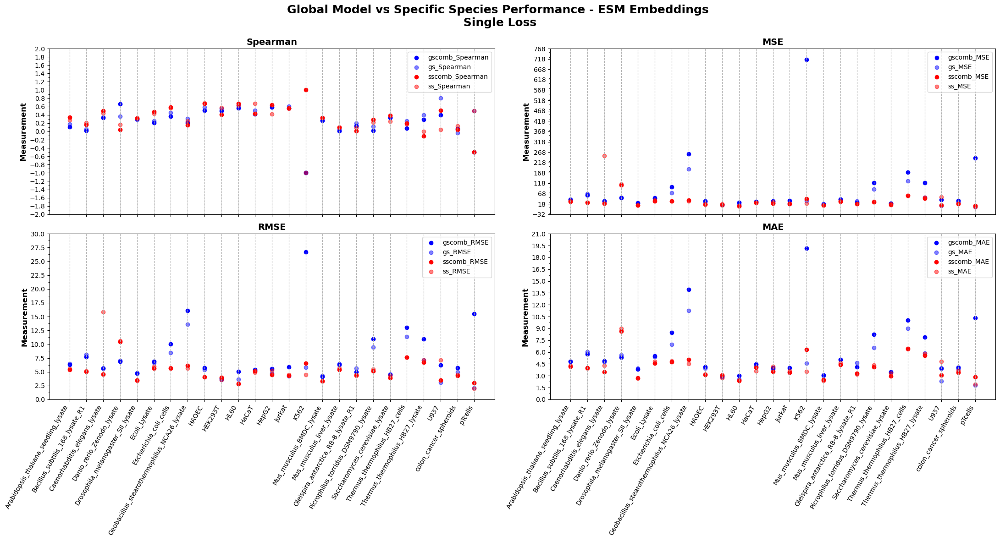

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def prepro_dfs(df_gs, df_ss, df_gscomb, df_sscomb, desired_method):
    df_gs = df_gs[['Unnamed: 0', f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_gs.columns = ['organisms', 'gsMSE_Spearman', 'gsMSE_MSE', 
                      'gsMSE_RMSE', 'gsMSE_MAE']
    
    df_ss = df_ss[[f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_ss.columns = ['ssMSE_Spearman', 'ssMSE_MSE', 
                      'ssMSE_RMSE', 'ssMSE_MAE']
    
    df_gscomb = df_gscomb[['Unnamed: 0', f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_gscomb.columns = ['organisms', 'gscombMSE_Spearman', 'gscombMSE_MSE', 
                      'gscombMSE_RMSE', 'gscombMSE_MAE']
    
    df_sscomb = df_sscomb[[f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_sscomb.columns = ['sscombMSE_Spearman', 'sscombMSE_MSE', 
                      'sscombMSE_RMSE', 'sscombMSE_MAE']

    return df_gs, df_ss, df_gscomb, df_sscomb

def plot_scatter_categorical_gs_vs_ss_deepseq_styleAll(file_path_gs, file_path_ss, 
                 sheet_name='ESM_only', 
                 sheet_namecomb='Both',
                 desired_method="MSE",
                 title_plot='Line Plots of Different Metrics by Algorithm',
                 path=''):
    
    df_gs = pd.read_excel(file_path_gs, sheet_name=sheet_name).iloc[0:25]
    df_ss = pd.read_excel(file_path_ss, sheet_name=sheet_name).iloc[0:25]
    df_gscomb = pd.read_excel(file_path_gs, sheet_name=sheet_namecomb).iloc[0:25]
    df_sscomb = pd.read_excel(file_path_ss, sheet_name=sheet_namecomb).iloc[0:25]
    

    df_gs, df_ss, df_gscomb, df_sscomb = prepro_dfs(df_gs, df_ss, df_gscomb, df_sscomb, desired_method)

    merged_df = pd.concat([df_gs, df_ss, df_gscomb, df_sscomb], axis=1)
    merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]
    df = merged_df

    # Step 2: Identify columns for each metric
    desired_mse_columns = ['gsMSE_MSE', 'ssMSE_MSE','gscombMSE_MSE', 'sscombMSE_MSE' ]
    metrics = ['Spearman', 'MSE', 'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}

    for column in df.columns:
        for metric in metrics:
            if metric == 'MSE':
                if column in desired_mse_columns:
                    grouped_columns[metric].append(column)
            else:
                if metric in column:
                    grouped_columns[metric].append(column)

    # Sort columns alphabetically regardless of case
    for metric in grouped_columns:
        grouped_columns[metric] = sorted(grouped_columns[metric], key=str.lower)

    # Step 3: Create subplots for each metric group
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(22, 12), sharex=True)
    axes = axes.flatten()

    # Define grid splits for each metric
    grid_splits = {
        'Spearman': 0.2,
        'MSE': 50,
        'RMSE': 2.5,
        'MAE': 1.5
    }

    #gs_ss_color_chart = {'gs': 'black', 'ss': 'orange', 'sscomb': 'purple', 'gscomb': 'blue'}
    gs_ss_color_chart = { 'gscomb':'blue', 'gs':(0, 0, 1, 0.5), 'sscomb':'red', 'ss':(1, 0, 0, 0.5)}
    
    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            for column in columns:
                print(column)

                if 'sscomb' in column: 
                    tag_color = gs_ss_color_chart['sscomb']
                    label = f'sscomb_{metric}'
                elif 'gscomb' in column: 
                    tag_color = gs_ss_color_chart['gscomb']
                    label = f'gscomb_{metric}'
                elif 'ss' in column: 
                    tag_color = gs_ss_color_chart['ss']
                    label = f'ss_{metric}'
                else:
                    tag_color = gs_ss_color_chart['gs']
                    label = f'gs_{metric}'
                

                scatter = axes[i].scatter(df['organisms'], df[column], color=tag_color, label=label)

            #axes[i].set_title(f'{metric}\n gscomb={df[columns[0]].mean():.3f}, gs={df[columns[1]].mean():.3f}, sscomb={df[columns[2]].mean():.3f}, ss={df[columns[3]].mean():.3f}', fontsize=14, fontweight='bold')
            axes[i].set_title(f'{metric}', fontsize=14, fontweight='bold')
            axes[i].set_xticks(range(len(df)))
            axes[i].set_xticklabels(df['organisms'], fontsize=10, rotation=60, ha='right')
            axes[i].xaxis.grid(True, linestyle='--', linewidth=0.9)

            ymin, ymax = axes[i].get_ylim()
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            axes[i].yaxis.set_minor_locator(plt.MultipleLocator(step / 2))
            axes[i].set_ylabel('Measurement', fontsize=12, fontweight='bold')

            axes[i].legend(loc='upper right', fontsize=10)

    plt.tight_layout()  # Adjust the padding between subplots and figure title
    plt.subplots_adjust(top=0.9)  # Adjust top as needed

    fig.suptitle(title_plot, fontsize=18, fontweight='bold')
    plt.savefig(path, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    plt.close()

# Example usage
file_path_gs = 'global_species.xlsx'
file_path_ss = 'spec_species.xlsx'
plot_scatter_categorical_gs_vs_ss_deepseq_styleAll(file_path_gs, file_path_ss, 
                                                sheet_name='ESM_only',
                                                sheet_namecomb='Both',  
                                                desired_method='MSE',
                                                title_plot='Global Model vs Specific Species Performance - ESM Embeddings\n Single Loss',
                                                path='Fig2_dot_performance_combine_embs.pdf')

gscombMSE_Spearman
gsMSE_Spearman
sscombMSE_Spearman
ssMSE_Spearman
gscombMSE_MSE
gsMSE_MSE
sscombMSE_MSE
ssMSE_MSE
gscombMSE_RMSE
gsMSE_RMSE
sscombMSE_RMSE
ssMSE_RMSE
gscombMSE_MAE
gsMSE_MAE
sscombMSE_MAE
ssMSE_MAE


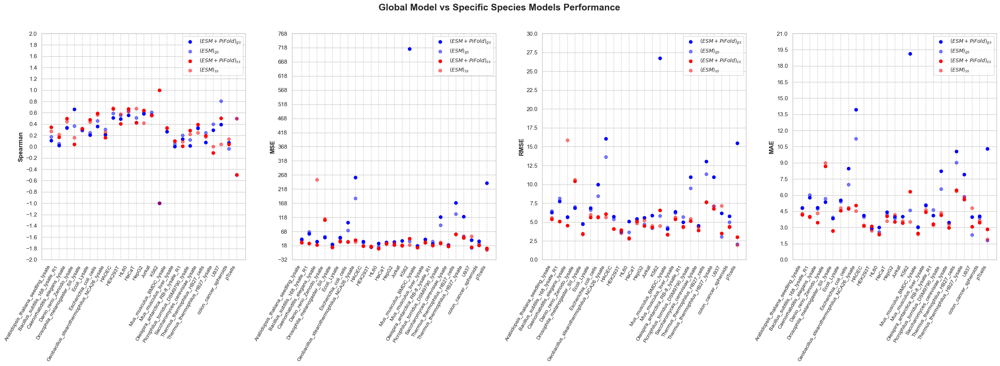

gscombMSE_RMSE
gsMSE_RMSE
sscombMSE_RMSE
ssMSE_RMSE


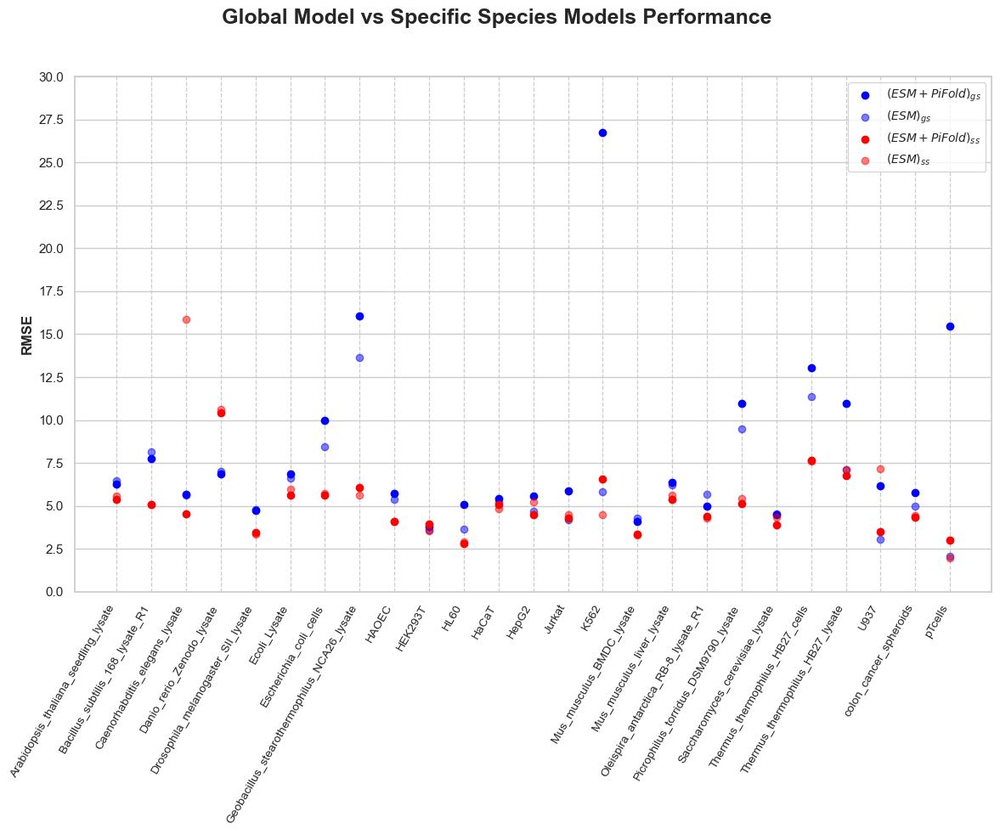

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def prepro_dfs(df_gs, df_ss, df_gscomb, df_sscomb, desired_method):
    df_gs = df_gs[['Unnamed: 0', f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    #df_gs.columns = ['organisms', 'gsMSE_Spearman', 'gsMSE_MSE', 
    #                  'gsMSE_RMSE', 'gsMSE_MAE']
    df_gs.columns = ['organisms', 'gsMSE_Spearman', 'gsMSE_MSE', 
                      'gsMSE_RMSE', 'gsMSE_MAE']
        
    df_ss = df_ss[[f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_ss.columns = ['ssMSE_Spearman', 'ssMSE_MSE', 
                      'ssMSE_RMSE', 'ssMSE_MAE']
    
    df_gscomb = df_gscomb[['Unnamed: 0', f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_gscomb.columns = ['organisms', 'gscombMSE_Spearman', 'gscombMSE_MSE', 
                      'gscombMSE_RMSE', 'gscombMSE_MAE']
    
    df_sscomb = df_sscomb[[f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_sscomb.columns = ['sscombMSE_Spearman', 'sscombMSE_MSE', 
                      'sscombMSE_RMSE', 'sscombMSE_MAE']

    return df_gs, df_ss, df_gscomb, df_sscomb

def plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAll(file_path_gs, file_path_ss, 
                 sheet_name='ESM_only', 
                 sheet_namecomb='Both',
                 desired_method="MSE",
                 title_plot='Line Plots of Different Metrics by Algorithm',
                 path='',
                 selector='all',
                 figsize = (22, 12)):
    
    df_gs = pd.read_excel(file_path_gs, sheet_name=sheet_name).iloc[0:25]
    df_ss = pd.read_excel(file_path_ss, sheet_name=sheet_name).iloc[0:25]
    df_gscomb = pd.read_excel(file_path_gs, sheet_name=sheet_namecomb).iloc[0:25]
    df_sscomb = pd.read_excel(file_path_ss, sheet_name=sheet_namecomb).iloc[0:25]
    
    df_gs, df_ss, df_gscomb, df_sscomb = prepro_dfs(df_gs, df_ss, df_gscomb, df_sscomb, desired_method)

    merged_df = pd.concat([df_gs, df_ss, df_gscomb, df_sscomb], axis=1)
    merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]
    df = merged_df

    # Step 2: Identify columns for each metric
    desired_mse_columns = ['gsMSE_MSE', 'ssMSE_MSE', 'gscombMSE_MSE', 'sscombMSE_MSE']
    metrics = ['Spearman', 'MSE', 'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}

    for column in df.columns:
        for metric in metrics:
            if metric == 'MSE':
                if column in desired_mse_columns:
                    grouped_columns[metric].append(column)
            else:
                if metric in column:
                    grouped_columns[metric].append(column)

    # Filter grouped_columns based on the selector
    if selector != 'all':
        grouped_columns = {metric: columns for metric, columns in grouped_columns.items() if metric == selector}

    # Sort columns alphabetically regardless of case
    for metric in grouped_columns:
        grouped_columns[metric] = sorted(grouped_columns[metric], key=str.lower)

    # Determine the number of metrics to plot
    num_metrics = len(grouped_columns)
    
    # Create a dynamic number of subplots based on the number of metrics
    fig, axes = plt.subplots(nrows=1, ncols=num_metrics, figsize=figsize, sharex=True)
    if num_metrics == 1:
        axes = [axes]

    # Define grid splits for each metric
    grid_splits = {
        'Spearman': 0.2,
        'MSE': 50,
        'RMSE': 2.5,
        'MAE': 1.5
    }

    gs_ss_color_chart = { 'gscomb': 'blue', 'gs': (0, 0, 1, 0.5), 'sscomb': 'red', 'ss': (1, 0, 0, 0.5)}
    
    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            for column in columns:
                print(column)

                if 'sscomb' in column: 
                    tag_color = gs_ss_color_chart['sscomb']
                    label = r'$(ESM + PiFold)_{ss}$'#f'sscomb_{metric}'
                elif 'gscomb' in column: 
                    tag_color = gs_ss_color_chart['gscomb']
                    label = r'$(ESM + PiFold)_{gs}$'#f'gscomb_{metric}'
                elif 'ss' in column: 
                    tag_color = gs_ss_color_chart['ss']
                    label = r'$(ESM)_{ss}$'#f'ss_{metric}'
                else:
                    tag_color = gs_ss_color_chart['gs']
                    label = r'$(ESM)_{gs}$'#f'gs_{metric}'
                

                scatter = axes[i].scatter(df['organisms'], df[column], color=tag_color, label=label)

            #axes[i].set_title(f'{metric}', fontsize=14, fontweight='bold')
            axes[i].set_xticks(range(len(df)))
            axes[i].set_xticklabels(df['organisms'], fontsize=10, rotation=60, ha='right')
            axes[i].xaxis.grid(True, linestyle='--', linewidth=0.9)

            ymin, ymax = axes[i].get_ylim()
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            axes[i].yaxis.set_minor_locator(plt.MultipleLocator(step / 2))
            axes[i].set_ylabel(f'{metric}', fontsize=12, fontweight='bold')

            axes[i].legend(loc='upper right', fontsize=10)

    plt.tight_layout()  # Adjust the padding between subplots and figure title
    plt.subplots_adjust(top=0.9)  # Adjust top as needed

    fig.suptitle(title_plot, fontsize=18, fontweight='bold')
    plt.savefig(path, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    plt.close()

file_path_gs = 'global_species.xlsx'
file_path_ss = 'spec_species.xlsx'
plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAll(file_path_gs, file_path_ss, 
                                                sheet_name='ESM_only',
                                                sheet_namecomb='Both',  
                                                desired_method='MSE',
                                                title_plot='Global Model vs Specific Species Models Performance',
                                                path='Fig2_dot_performance_combine_embs.pdf',
                                                selector='all',
                                                figsize=(27, 10))


plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAll(file_path_gs, file_path_ss, 
                                                sheet_name='ESM_only',
                                                sheet_namecomb='Both',  
                                                desired_method='MSE',
                                                title_plot='Global Model vs Specific Species Models Performance',
                                                path='Fig2_dot_performance_combine_embsRMSE.pdf',
                                                selector='RMSE',
                                                figsize=(12, 10))

# Same Plot but sorting in a descendent order

gscombMSE_RMSE
gsMSE_RMSE
sscombMSE_RMSE
ssMSE_RMSE


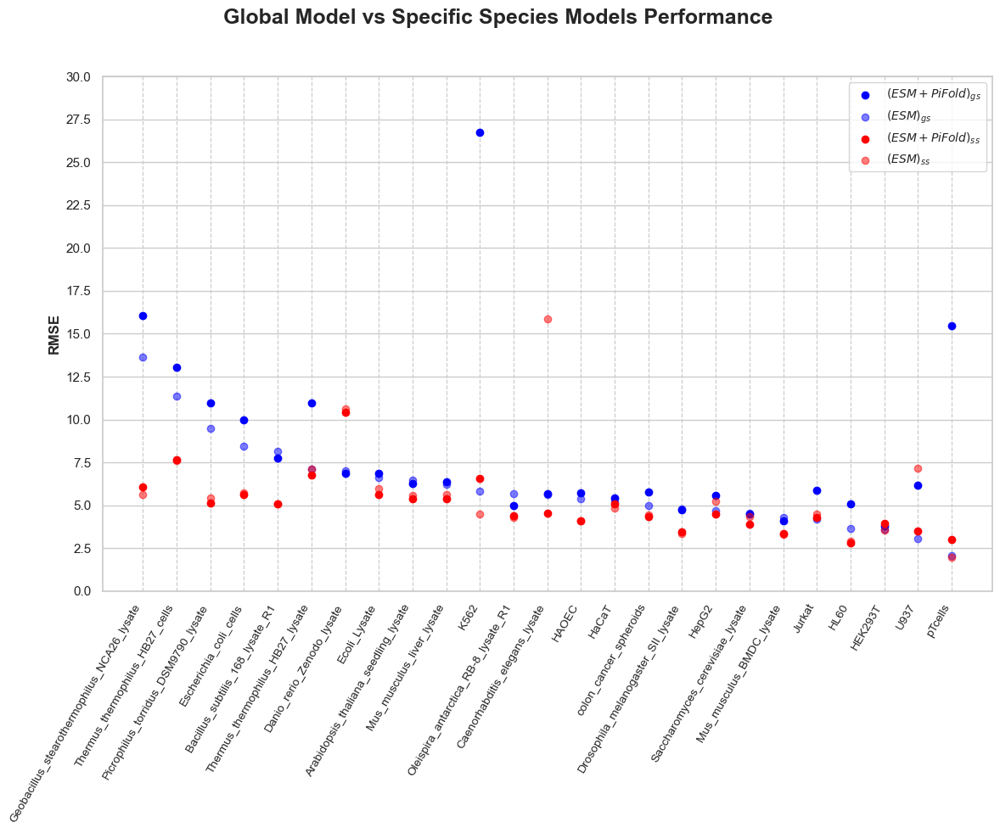

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def prepro_dfs(df_gs, df_ss, df_gscomb, df_sscomb, desired_method):
    df_gs = df_gs[['Unnamed: 0', f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_gs.columns = ['organisms', 'gsMSE_Spearman', 'gsMSE_MSE', 
                      'gsMSE_RMSE', 'gsMSE_MAE']
        
    df_ss = df_ss[[f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_ss.columns = ['ssMSE_Spearman', 'ssMSE_MSE', 
                      'ssMSE_RMSE', 'ssMSE_MAE']
    
    df_gscomb = df_gscomb[['Unnamed: 0', f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_gscomb.columns = ['organisms', 'gscombMSE_Spearman', 'gscombMSE_MSE', 
                      'gscombMSE_RMSE', 'gscombMSE_MAE']
    
    df_sscomb = df_sscomb[[f'{desired_method}_Spearman', f'{desired_method}_MSE', 
                    f'{desired_method}_RMSE', f'{desired_method}_MAE']]
    df_sscomb.columns = ['sscombMSE_Spearman', 'sscombMSE_MSE', 
                      'sscombMSE_RMSE', 'sscombMSE_MAE']

    return df_gs, df_ss, df_gscomb, df_sscomb

def plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAllsorted(file_path_gs, file_path_ss, 
                 sheet_name='ESM_only', 
                 sheet_namecomb='Both',
                 desired_method="MSE",
                 title_plot='Line Plots of Different Metrics by Algorithm',
                 path='',
                 selector='all',
                 figsize = (22, 12)):
    
    df_gs = pd.read_excel(file_path_gs, sheet_name=sheet_name).iloc[0:25]
    df_ss = pd.read_excel(file_path_ss, sheet_name=sheet_name).iloc[0:25]
    df_gscomb = pd.read_excel(file_path_gs, sheet_name=sheet_namecomb).iloc[0:25]
    df_sscomb = pd.read_excel(file_path_ss, sheet_name=sheet_namecomb).iloc[0:25]
    
    df_gs, df_ss, df_gscomb, df_sscomb = prepro_dfs(df_gs, df_ss, df_gscomb, df_sscomb, desired_method)

    merged_df = pd.concat([df_gs, df_ss, df_gscomb, df_sscomb], axis=1)
    merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]
    df = merged_df

    # Sort df by the desired metric in descending order
    df = df.sort_values(by=f'gsMSE_{selector}', ascending=False).reset_index(drop=True)

    # Step 2: Identify columns for each metric
    desired_mse_columns = ['gsMSE_MSE', 'ssMSE_MSE', 'gscombMSE_MSE', 'sscombMSE_MSE']
    metrics = ['Spearman', 'MSE', 'RMSE', 'MAE']
    grouped_columns = {metric: [] for metric in metrics}

    for column in df.columns:
        for metric in metrics:
            if metric == 'MSE':
                if column in desired_mse_columns:
                    grouped_columns[metric].append(column)
            else:
                if metric in column:
                    grouped_columns[metric].append(column)

    # Filter grouped_columns based on the selector
    if selector != 'all':
        grouped_columns = {metric: columns for metric, columns in grouped_columns.items() if metric == selector}

    # Sort columns alphabetically regardless of case
    for metric in grouped_columns:
        grouped_columns[metric] = sorted(grouped_columns[metric], key=str.lower)

    # Determine the number of metrics to plot
    num_metrics = len(grouped_columns)
    
    # Create a dynamic number of subplots based on the number of metrics
    fig, axes = plt.subplots(nrows=1, ncols=num_metrics, figsize=figsize, sharex=True)
    if num_metrics == 1:
        axes = [axes]

    # Define grid splits for each metric
    grid_splits = {
        'Spearman': 0.2,
        'MSE': 50,
        'RMSE': 2.5,
        'MAE': 1.5
    }

    gs_ss_color_chart = { 'gscomb': 'blue', 'gs': (0, 0, 1, 0.5), 'sscomb': 'red', 'ss': (1, 0, 0, 0.5)}
    
    for i, (metric, columns) in enumerate(grouped_columns.items()):
        if columns:
            for column in columns:
                print(column)

                if 'sscomb' in column: 
                    tag_color = gs_ss_color_chart['sscomb']
                    label = r'$(ESM + PiFold)_{ss}$'#f'sscomb_{metric}'
                elif 'gscomb' in column: 
                    tag_color = gs_ss_color_chart['gscomb']
                    label = r'$(ESM + PiFold)_{gs}$'#f'gscomb_{metric}'
                elif 'ss' in column: 
                    tag_color = gs_ss_color_chart['ss']
                    label = r'$(ESM)_{ss}$'#f'ss_{metric}'
                else:
                    tag_color = gs_ss_color_chart['gs']
                    label = r'$(ESM)_{gs}$'#f'gs_{metric}'
                

                scatter = axes[i].scatter(df['organisms'], df[column], color=tag_color, label=label)

            #axes[i].set_title(f'{metric}', fontsize=14, fontweight='bold')
            axes[i].set_xticks(range(len(df)))
            axes[i].set_xticklabels(df['organisms'], fontsize=10, rotation=60, ha='right')
            axes[i].xaxis.grid(True, linestyle='--', linewidth=0.9)

            ymin, ymax = axes[i].get_ylim()
            step = grid_splits[metric]
            axes[i].set_yticks(np.arange(np.floor(ymin), np.ceil(ymax) + step, step))
            axes[i].yaxis.set_minor_locator(plt.MultipleLocator(step / 2))
            axes[i].set_ylabel(f'{metric}', fontsize=12, fontweight='bold')

            axes[i].legend(loc='upper right', fontsize=10)

    plt.tight_layout()  # Adjust the padding between subplots and figure title
    plt.subplots_adjust(top=0.9)  # Adjust top as needed

    fig.suptitle(title_plot, fontsize=18, fontweight='bold')
    plt.savefig(path, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    plt.close()

file_path_gs = 'global_species.xlsx'
file_path_ss = 'spec_species.xlsx'

plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAllsorted(file_path_gs, file_path_ss, 
                                                sheet_name='ESM_only',
                                                sheet_namecomb='Both',  
                                                desired_method='MSE',
                                                title_plot='Global Model vs Specific Species Models Performance',
                                                path='Fig2_dot_performance_combine_embsRMSE.pdf',
                                                selector='RMSE',
                                                figsize=(12, 10))




# START THE PLOTS FOR THE HISTORY

## Narrative Roadmap

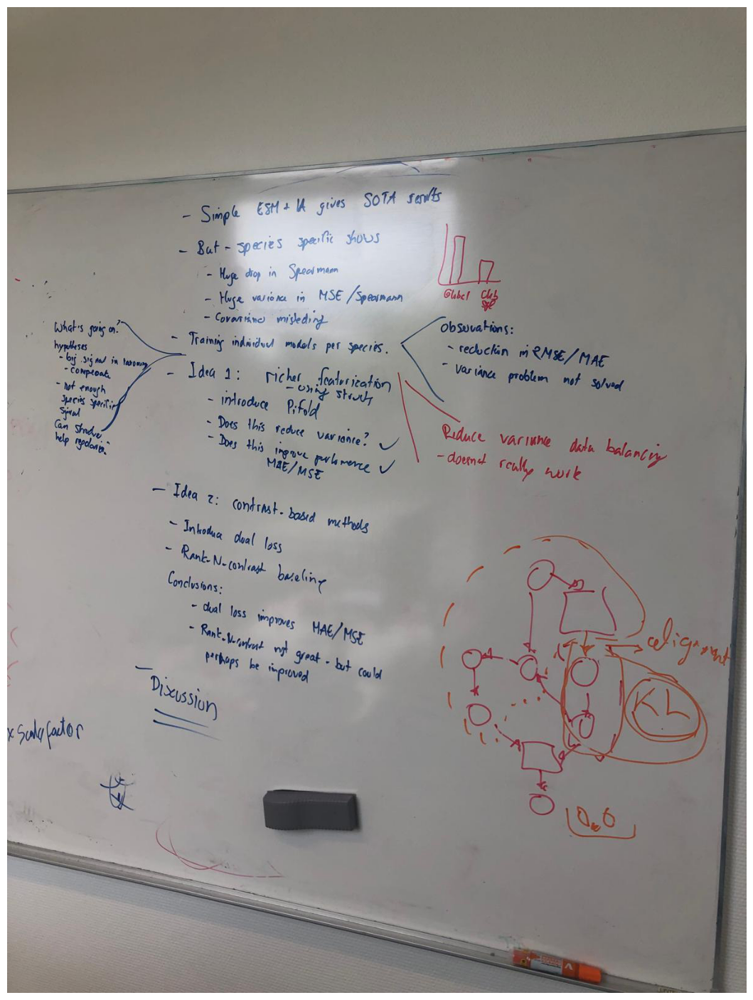

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the image
image = mpimg.imread('Roadmap.jpeg')
plt.figure(figsize=(25, 18)) 
# Display the image
plt.imshow(image)
plt.axis('off')  # Optional: Turn off axis
plt.show()

###     A) Simple ESM + LA gives SOTA results

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_76598/3794866981.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.Method.iloc[3]='rankN'


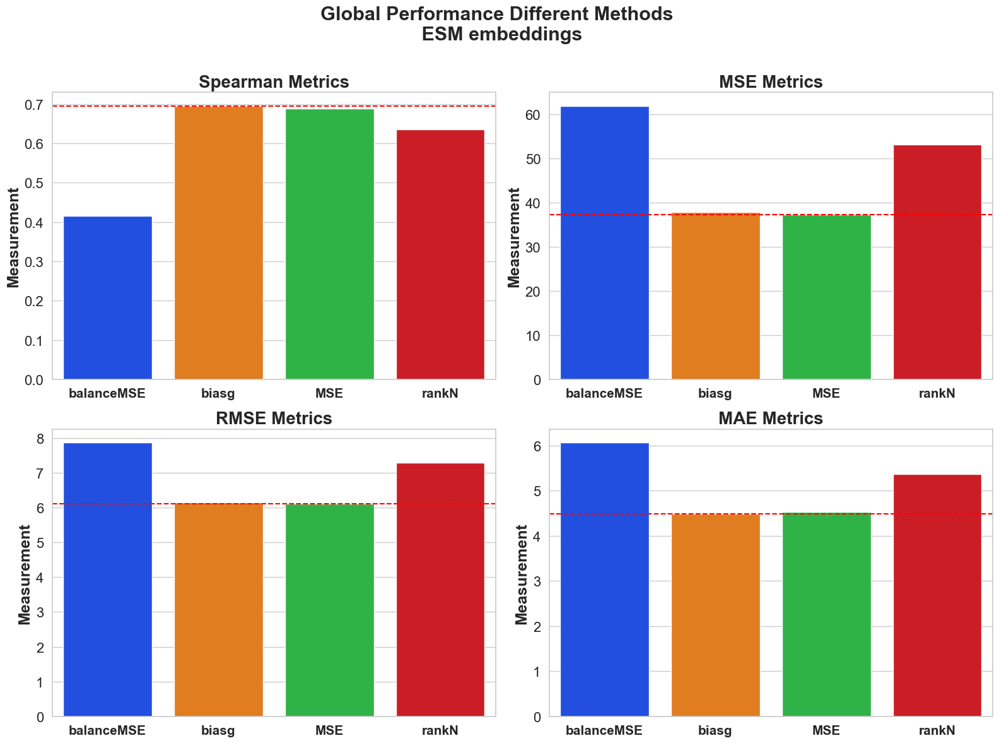

In [7]:
# Example usage
file_path = 'global.xlsx'  # Replace with your actual file path
plot_barplots_from_excel(file_path, global_title="Global Performance Different Methods \n ESM embeddings")

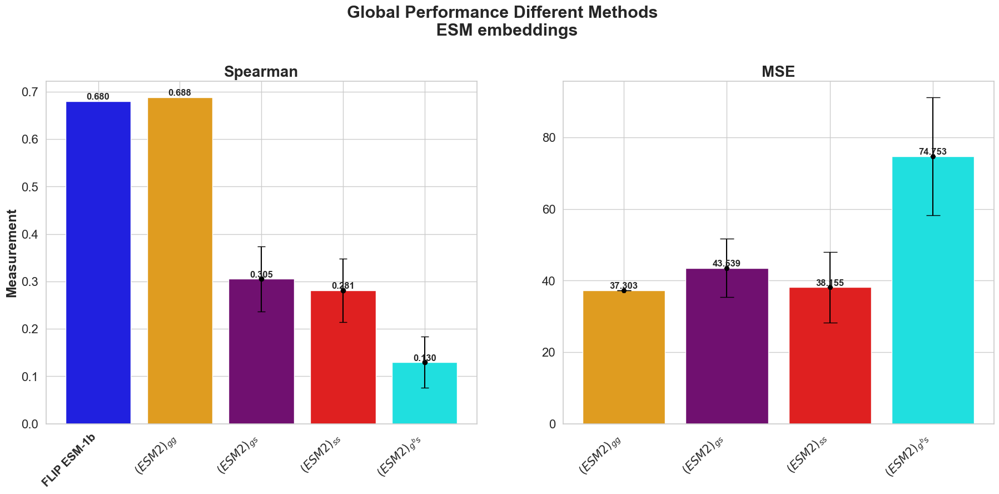

In [43]:
plot_barplots_for_preprint_global('global.xlsx', 'global_species.xlsx', 'spec_species.xlsx', global_title="Global Performance Different Methods \n ESM embeddings")


###     B) JUST ESM --- SPECIFIC SPECIES SHOWS BETTER PERFORMANCE THAN GLOBAL ONE, AND METRICS DROPS

gscombMSE_RMSE
gsMSE_RMSE
sscombMSE_RMSE
ssMSE_RMSE


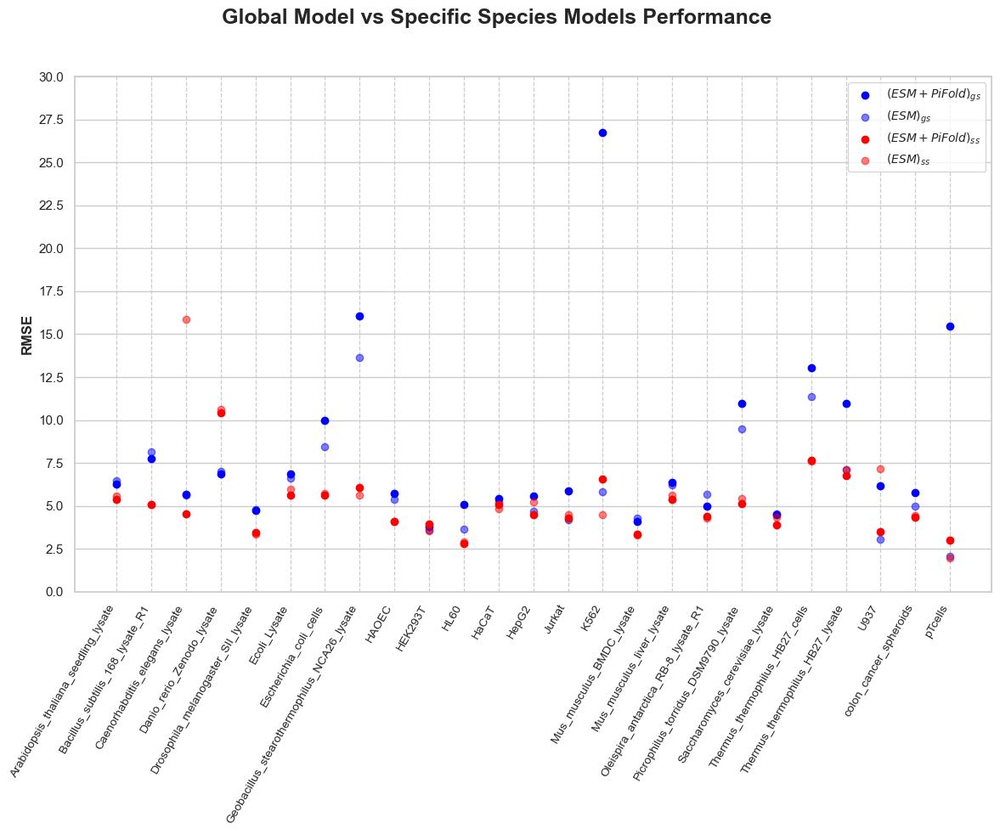

gscombMSE_Spearman
gsMSE_Spearman
sscombMSE_Spearman
ssMSE_Spearman
gscombMSE_MSE
gsMSE_MSE
sscombMSE_MSE
ssMSE_MSE
gscombMSE_RMSE
gsMSE_RMSE
sscombMSE_RMSE
ssMSE_RMSE
gscombMSE_MAE
gsMSE_MAE
sscombMSE_MAE
ssMSE_MAE


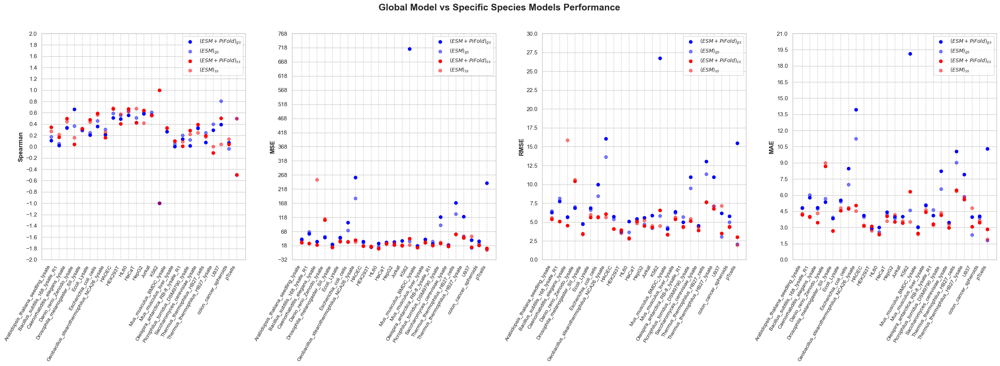

In [46]:
#plot_metrics('global_species.xlsx','spec_species.xlsx', sheet_name='ESM_only', desired_method='MSE',
#             title_plot='Global Model vs Specific Species Performance - ESM Embeddings\n Single Loss')
"""
plot_scatter_categorical_gs_vs_ss_deepseq_style(
    'global_species.xlsx', 'spec_species.xlsx', sheet_name='ESM_only', desired_method='MSE',
    title_plot='Global Model vs Specific Species Performance - ESM Embeddings\n Single Loss')
"""
#plot_scatter_categorical_gs_vs_ss_deepseq_styleAll(file_path_gs, file_path_ss, 
#                                                sheet_name='ESM_only',
#                                                sheet_namecomb='Both',  
#                                                desired_method='MSE',
#                                                title_plot='Global Model vs Specific Species Performance - ESM Embeddings\n Single Loss',
#                                                path='Fig2_dot_performance_combine_embs.pdf')

"""
plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAll(file_path_gs, file_path_ss, 
                                                sheet_name='ESM_only',
                                                sheet_namecomb='Both',  
                                                desired_method='MSE',
                                                title_plot='Global Model vs Specific Species Performance \n Single Loss',
                                                path='Fig2_dot_performance_combine_embsRMSE.pdf',
                                                selector='RMSE')

plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAll(file_path_gs, file_path_ss, 
                                                sheet_name='ESM_only',
                                                sheet_namecomb='Both',  
                                                desired_method='MSE',
                                                title_plot='Global Model vs Specific Species Performance \n Single Loss',
                                                path='Fig2_dot_performance_combine_embs_ALL.pdf',
                                                selector='all')
"""

file_path_gs = 'global_species.xlsx'
file_path_ss = 'spec_species.xlsx'

plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAll(file_path_gs, file_path_ss, 
                                                sheet_name='ESM_only',
                                                sheet_namecomb='Both',  
                                                desired_method='MSE',
                                                title_plot='Global Model vs Specific Species Models Performance',
                                                path='Fig2_dot_performance_combine_embsRMSE.pdf',
                                                selector='RMSE',
                                                figsize=(12, 10))

plot_scatter_categorical_gs_vs_ss_deepseq_styleCUSTOMAll(file_path_gs, file_path_ss, 
                                                sheet_name='ESM_only',
                                                sheet_namecomb='Both',  
                                                desired_method='MSE',
                                                title_plot='Global Model vs Specific Species Models Performance',
                                                path='Fig2_dot_performance_combine_embs_ALL.pdf',
                                                selector='all',
                                                figsize=(27, 10))

###     C) JUST ESM --- Spearman Misleading, i.e. Despite a high Spearman, that would show just the trend despite you can have a big gap in the prediction vs ground truth

In [ ]:
#create_subplot_grid('global_species/ESM_only/MSE/', title = 'Global Model to Species: ESM Embeddings \n Single Loss (MSE)')
#create_subplot_grid('species/ESM_only/MSE/', title = 'Specific Model to Species: ESM Embeddings \n Single Loss (MSE)')


###     IDEA 1) --- ENRICH REPRESENTATION USING STRUCTURAL FEATURES - INVERSE FOLDING

In [ ]:
#plot_metrics('global_species.xlsx','spec_species.xlsx', sheet_name='Both', desired_method='MSE',
#             title_plot='Global Model vs Specific Species Performance - ESM + PiFold\n Single Loss')

#plot_scatter_categorical_gs_vs_ss_deepseq_style(
#    'global_species.xlsx', 'spec_species.xlsx', sheet_name='Both', desired_method='MSE',
#    title_plot='Global Model vs Specific Species Performance - ESM + PiFold\n Single Loss')

###     IDEA 2) CONTRASTIVE BASED METHODS FOR BIASING PREDICTION TOWARD ORGANISMS PERFORMANCE

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_17380/1195319473.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


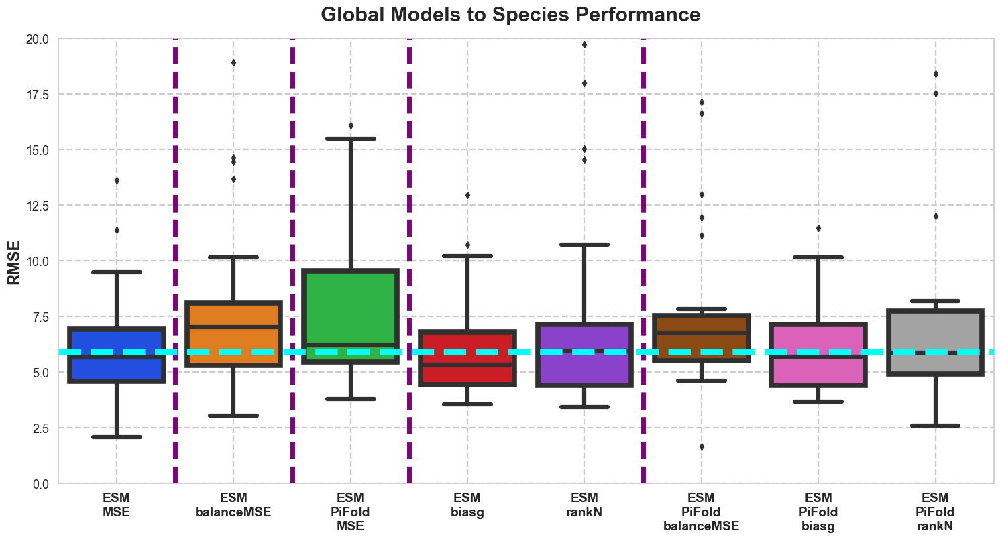

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_17380/1195319473.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


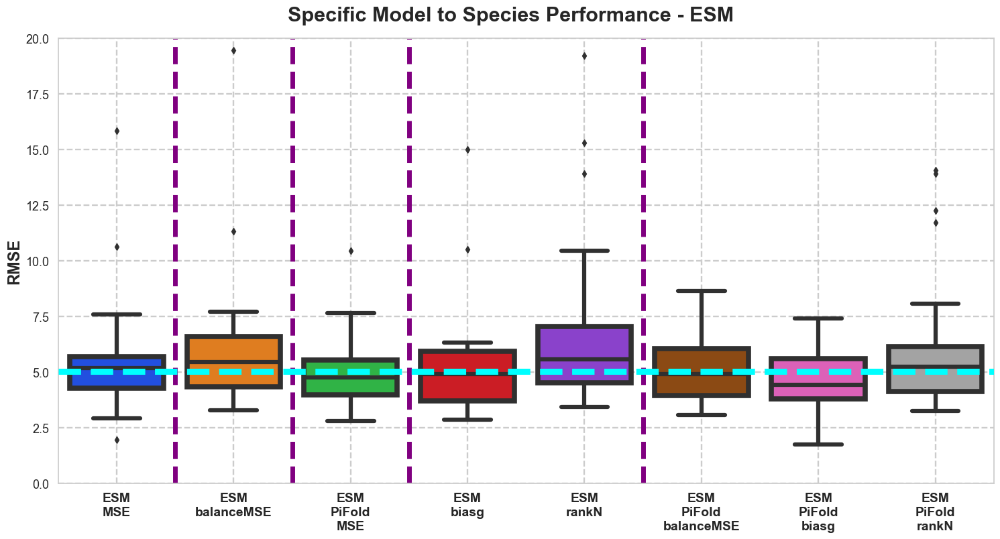

In [17]:
file_path = 'global_species.xlsx'
sheets=['ESM_only', 'PiFold_only', 'Both']

# Example of custom line positions for each metric
custom_lines = {
    'Spearman': [0.5, 1.5, 2.5, 4.5],
    'MSE': [0.5, 1.5, 2.5, 4.5],
    'RMSE': [0.5, 1.5, 2.5, 4.5],
    'MAE': [0.5, 1.5, 2.5, 4.5]
}

#plot_violins_variance_per_sheet(file_path, sheets[0])
#plot_violins_variance_per_sheet(file_path, sheets[1])
#plot_violins_variance_per_sheet('global_species.xlsx', sheets[2])
#plot_violins_variance_per_sheet('spec_species.xlsx', sheets[2])

#plot_violins_variance_per_sheet('global_species.xlsx', sheets[2], title='Global Model to Species Performance - ESM + PiFold Embeddings \n Methods Comparison')
#plot_violins_variance_per_sheet('spec_species.xlsx', sheets[2], title='Specific Species Models Performance - ESM + PiFold Embeddings \n Methods Comparison')
#plot_violins_variance_custom('global_species.xlsx', sheets, title='Global Models Applied to Species\nMethods Comparison', custom_lines=custom_lines)
#plot_violins_variance_custom('spec_species.xlsx', sheets, title='Methods Comparison', custom_lines=custom_lines)


"""
plot_violins_variance_custom(file_path, sheets, 
                             title='Global Models to Species Performance \n Methods Comparison', 
                             custom_lines=custom_lines,
                             path='Fig4_violins_gs_ss_bench_a.pdf')

plot_violins_variance_custom('spec_species.xlsx', 
                                sheets, 
                                title='Specific Species Model to Species Performance \n Methods Comparison', 
                                  custom_lines=custom_lines,
                                  path='Fig4_violins_gs_ss_bench_b.pdf')
"""


plot_violins_variance_custom_flex('global_species.xlsx', 
                                sheets, 
                                title='Global Models to Species Performance', 
                                  custom_lines=custom_lines,
                                  path='Fig3_boxplot_performance_Allgs.pdf',
                                  selector=['RMSE'],
                                  strategy='boxplot',
                                  metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 20], #[0,20]
                                                        'MAE': [0, 10] #[0,10]
                                                    })

plot_violins_variance_custom_flex('spec_species.xlsx', 
                                sheets, 
                                title='Specific Model to Species Performance - ESM', 
                                  custom_lines=custom_lines,
                                  path='Fig3_boxplot_performance_Allss.pdf',
                                  selector=['RMSE'],
                                  strategy='boxplot',
                                  metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 20], #[0,20]
                                                        'MAE': [0, 10] #[0,10]
                                                    })


#     APENDIX) SCATTERPLOTS PREDICTIONS PER EXPERIMENT AND RESULT TABLES

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_25235/1450506997.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


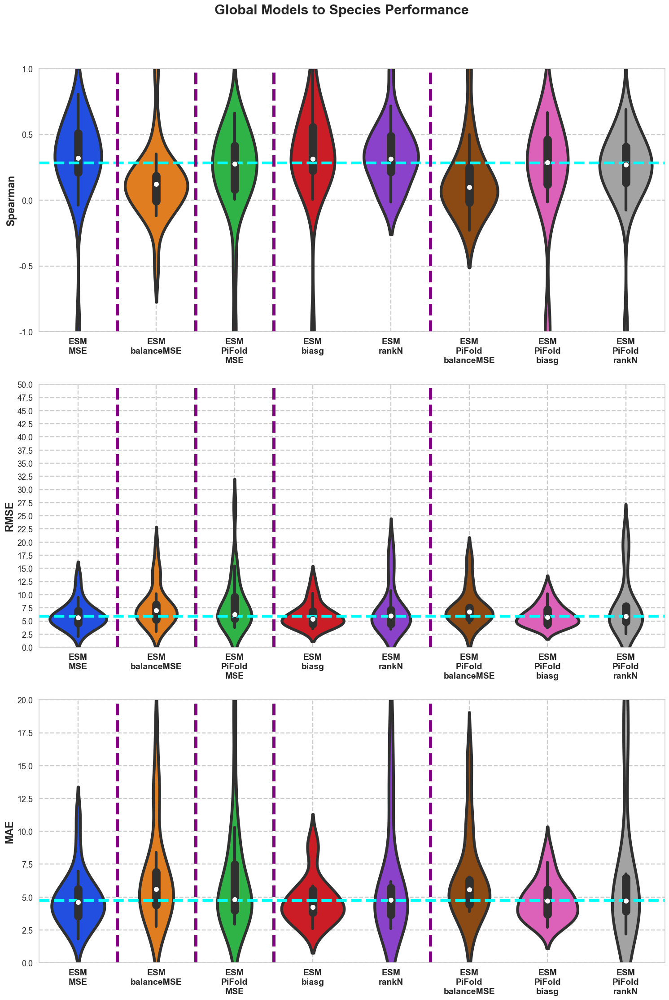

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_25235/1450506997.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


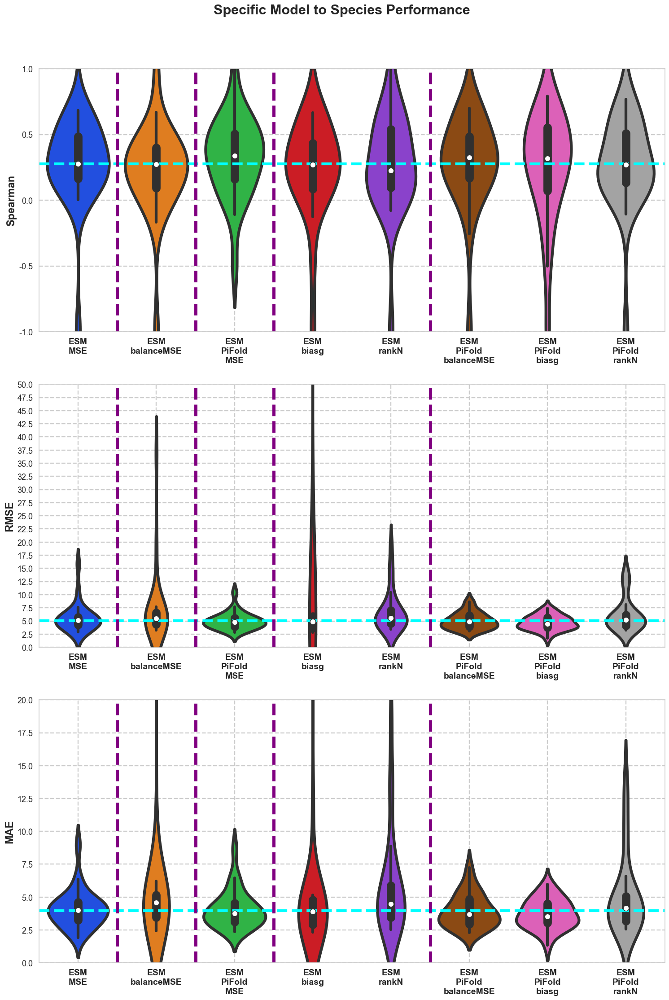

In [91]:
plot_violins_variance_custom_flex('global_species.xlsx', 
                                sheets, 
                                title='Global Models to Species Performance', 
                                  custom_lines=custom_lines,
                                  path='Fig3_violin_performance_Allgs.pdf',
                                  selector=['Spearman','MAE','RMSE'],
                                  strategy='violin',
                                  metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 50], #[0,20]
                                                        'MAE': [0, 20] #[0,10]
                                                    })

plot_violins_variance_custom_flex('spec_species.xlsx', 
                                sheets, 
                                title='Specific Model to Species Performance', 
                                  custom_lines=custom_lines,
                                  path='Fig3_violin_performance_Allss.pdf',
                                  selector=['Spearman','MAE','RMSE'],
                                  strategy='violin',
                                  metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 50], #[0,20]
                                                        'MAE': [0, 20] #[0,10]
                                                    })

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_25235/1450506997.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


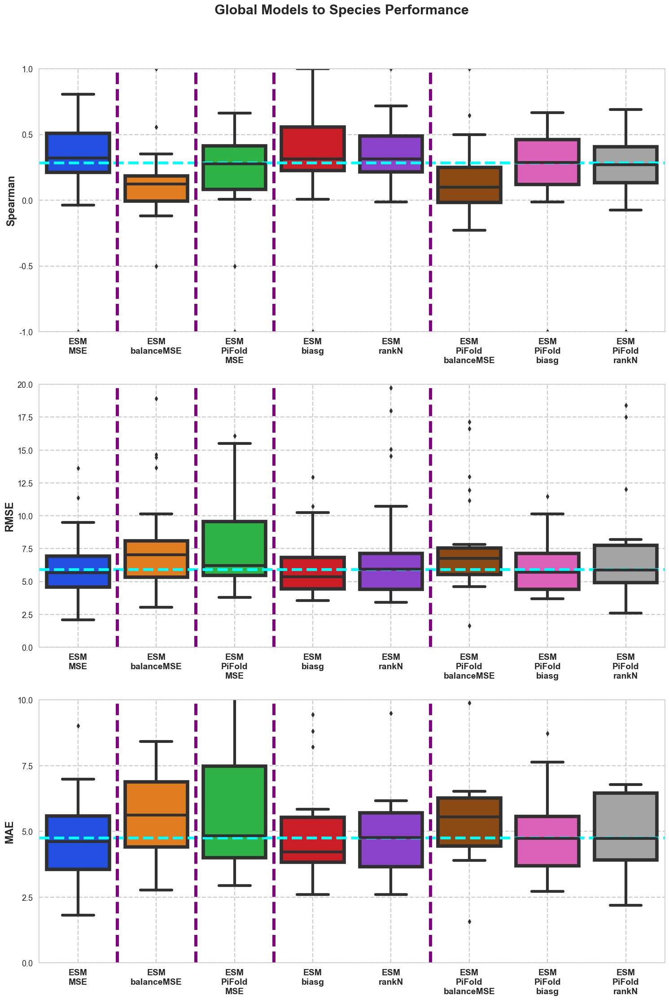

/var/folders/xb/pk0scl4j289by2rlc_ssyzsr0000gp/T/ipykernel_25235/1450506997.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


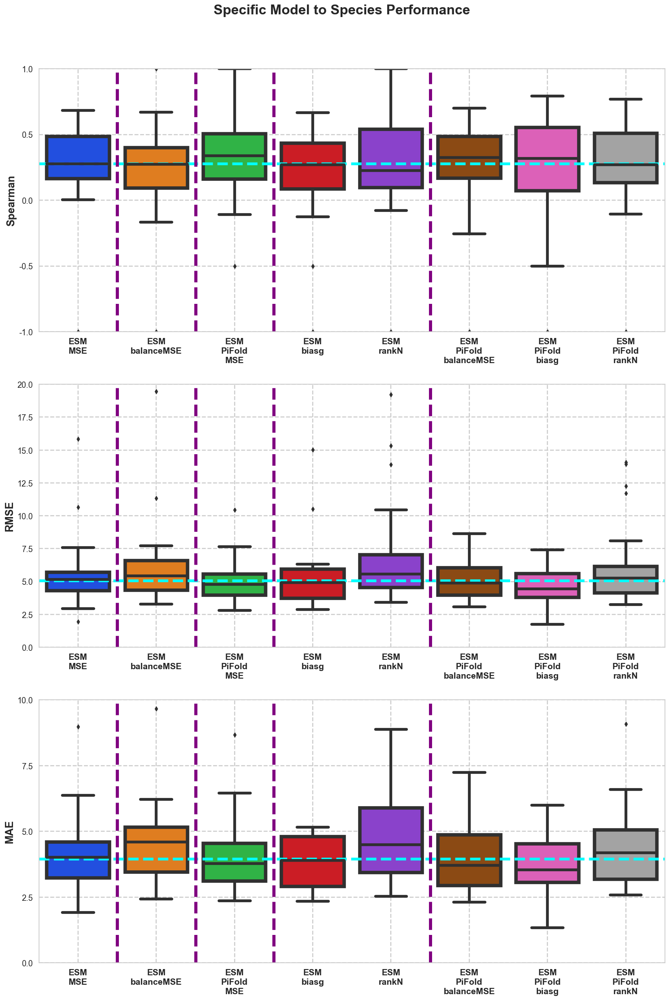

In [92]:
plot_violins_variance_custom_flex('global_species.xlsx', 
                                sheets, 
                                title='Global Models to Species Performance', 
                                  custom_lines=custom_lines,
                                  path='Fig3_boxplot_performance_Allgs_allmetrics.pdf',
                                  selector=['Spearman','MAE','RMSE'],
                                  strategy='boxplot',
                                  metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 20], #[0,20]
                                                        'MAE': [0, 10] #[0,10]
                                                    })

plot_violins_variance_custom_flex('spec_species.xlsx', 
                                sheets, 
                                title='Specific Model to Species Performance', 
                                  custom_lines=custom_lines,
                                  path='Fig3_boxplot_performance_Allss_allmetrics.pdf',
                                  selector=['Spearman','MAE','RMSE'],
                                  strategy='boxplot',
                                  metrics_y_ranges = {
                                                        'Spearman': [-1, 1],
                                                        'RMSE': [0, 20], #[0,20]
                                                        'MAE': [0, 10] #[0,10]
                                                        })

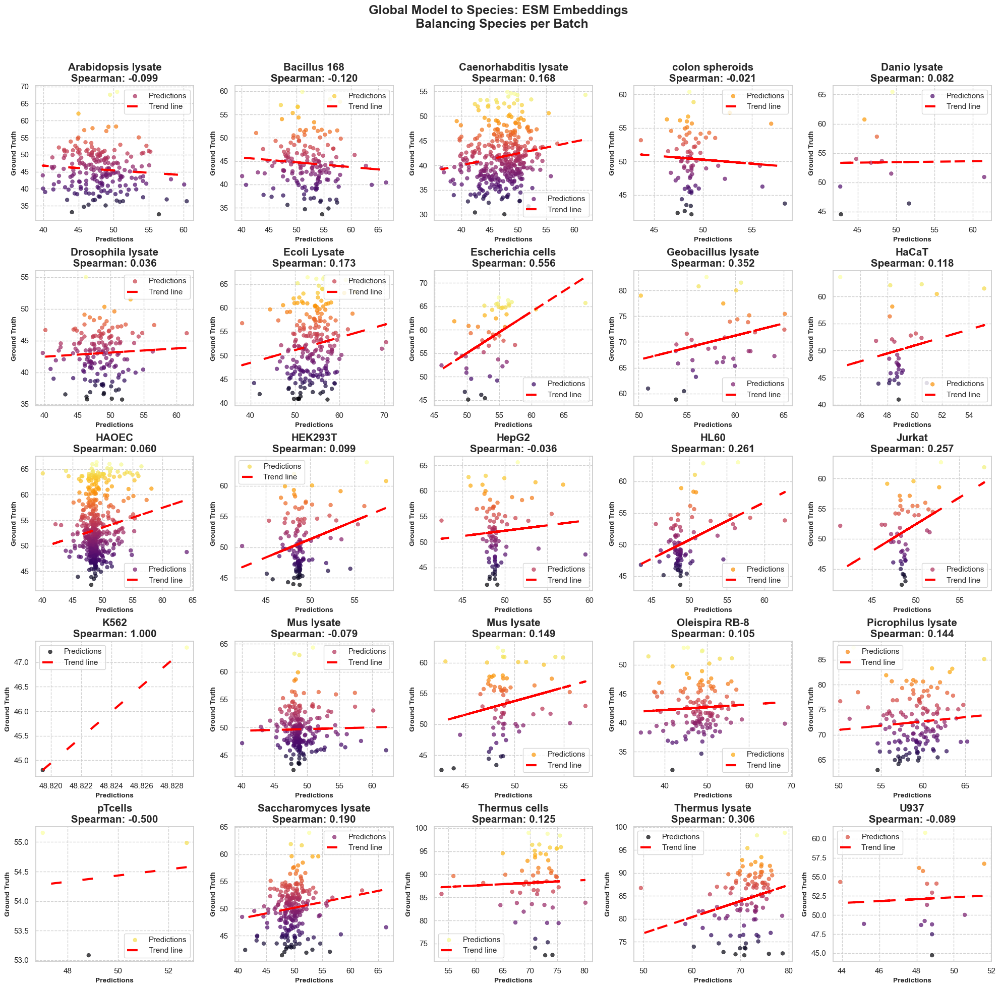

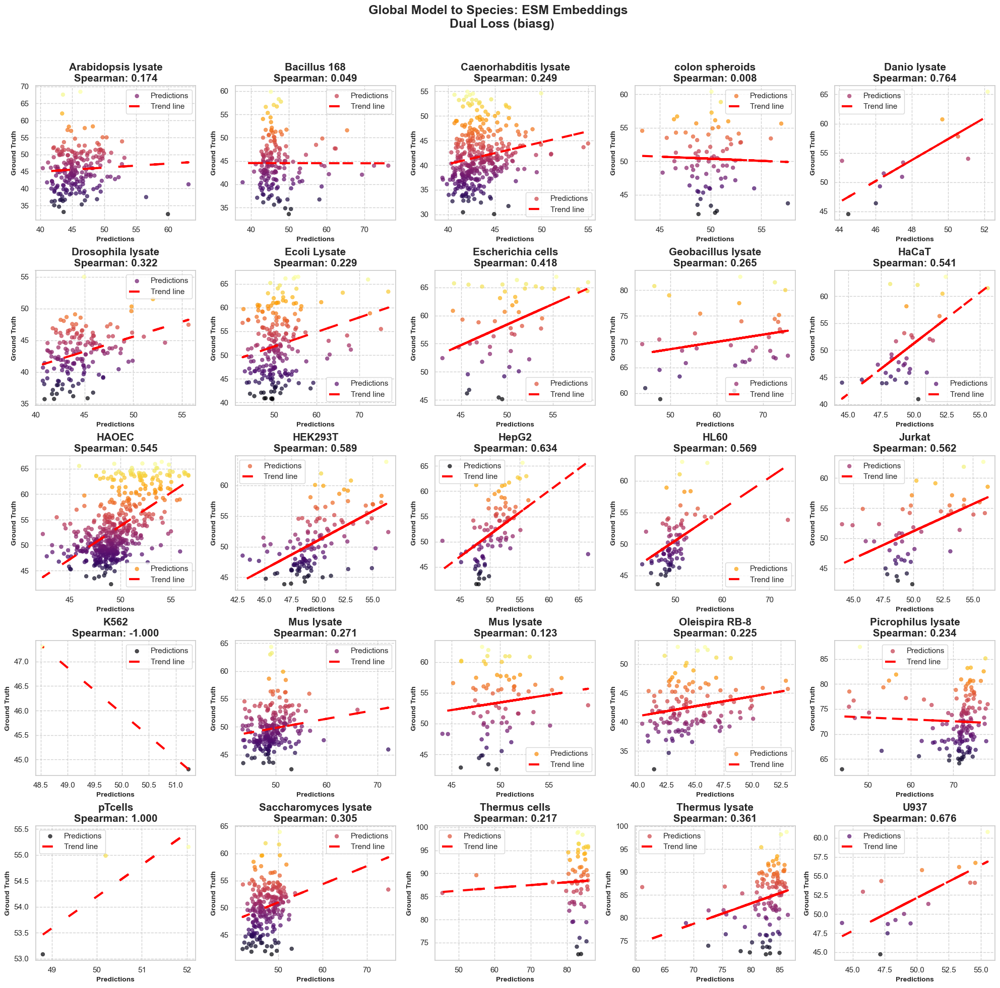

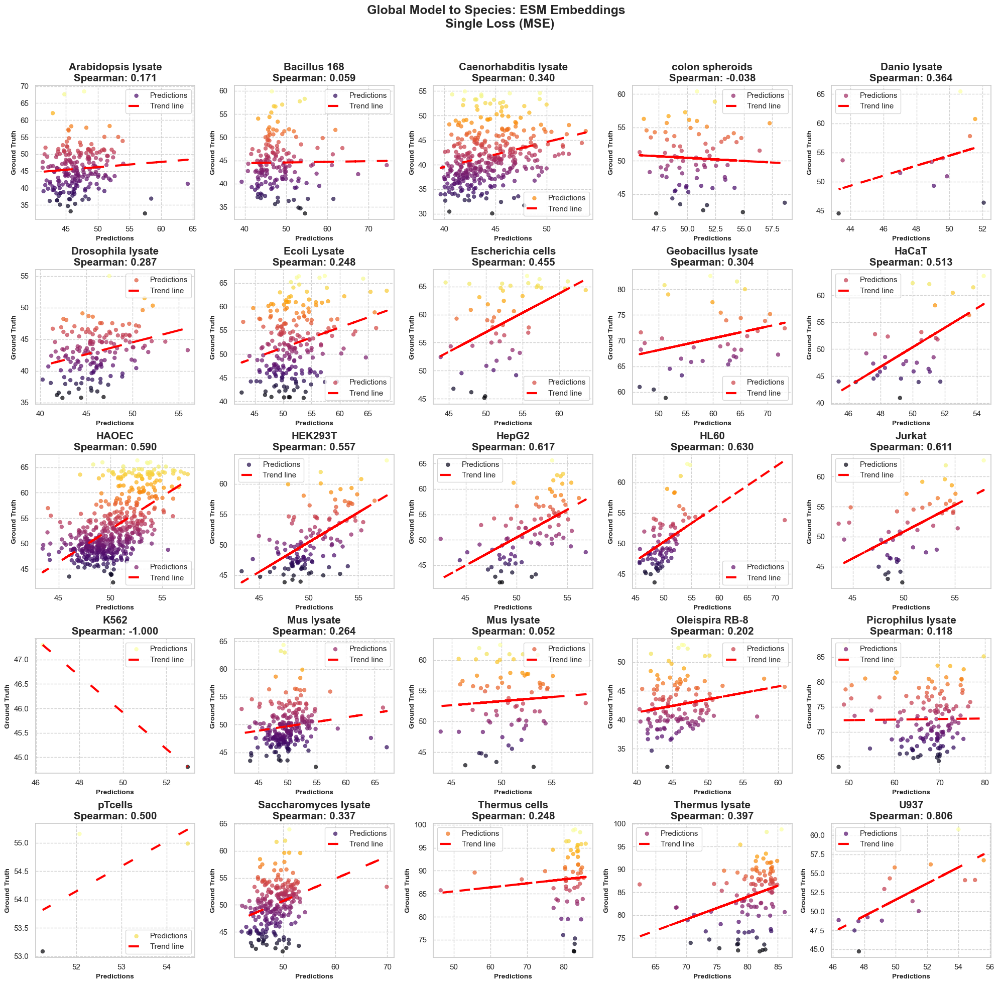

In [25]:
create_subplot_grid('global_species/ESM_only/balanceMSE/', title = 'Global Model to Species: ESM Embeddings \n Balancing Species per Batch', out='scatter_gs_balance.pdf')
create_subplot_grid('global_species/ESM_only/biasg/', title = 'Global Model to Species: ESM Embeddings \n Dual Loss (biasg)',out='scatter_gs_biasg.pdf')
create_subplot_grid('global_species/ESM_only/MSE/', title = 'Global Model to Species: ESM Embeddings \n Single Loss (MSE)', out='scatter_gs_MSE.pdf')
create_subplot_grid('global_species/ESM_only/rankN/', title = 'Global Model to Species: ESM Embeddings \n Rank N Contrast Loss', out='scatter_gs_rankN.pdf')
create_subplot_grid('global_species/Both/balanceMSE/', title = 'Global Model to Species: ESM + PiFold Embeddings \n Balancing Species per Batch', out='scatter_gscomb_balance.pdf')
create_subplot_grid('global_species/Both/biasg/', title = 'Global Model to Species: ESM + PiFold Embeddings \n Dual Loss (biasg)', out='scatter_gscomb_biasg.pdf')
create_subplot_grid('global_species/Both/MSE/', title = 'Global Model to Species: ESM + PiFold Embeddings \n Single Loss (MSE)', out='scatter_gscomb_MSE.pdf')
create_subplot_grid('global_species/Both/rankN/', title = 'Global Model to Species: ESM + PiFold Embeddings \n Rank N Contrast Loss', out='scatter_gscomb_rankN.pdf')

create_subplot_grid('species/ESM_only/balanceMSE/', title = 'Specific Model to Species: ESM Embeddings \n Balancing Species per Batch', out='scatter_ss_balance.pdf')
create_subplot_grid('species/ESM_only/biasg/', title = 'Specific Model to Species: ESM Embeddings \n Dual Loss (biasg)', out='scatter_ss_biasg.pdf')
create_subplot_grid('species/ESM_only/MSE/', title = 'Specific Model to Species: ESM Embeddings \n Single Loss (MSE)', out='scatter_ss_MSE.pdf')
create_subplot_grid('species/ESM_only/rankN/', title = 'Specific Model to Species: ESM Embeddings \n Rank N Contrast Loss', out='scatter_ss_rankN.pdf')
create_subplot_grid('species/Both/balanceMSE/', title = 'Specific Model to Species: ESM + PiFold Embeddings \n Balancing Species per Batch', out='scatter_sscomb_balance.pdf')
create_subplot_grid('species/Both/biasg/', title = 'Specific Model to Species: ESM + PiFold Embeddings \n Dual Loss (biasg)', out='scatter_sscomb_biasg.pdf')
create_subplot_grid('species/Both/MSE/', title = 'Specific Model to Species: ESM + PiFold Embeddings \n Single Loss (MSE)', out='scatter_sscomb_MSE.pdf')
create_subplot_grid('species/Both/rankN/', title = 'Specific Model to Species: ESM + PiFold Embeddings \n Rank N Contrast Loss', out='scatter_sscomb_rankN.pdf')


#---------------------------------------------------------------

In [13]:
import pandas as pd
from tabulate import tabulate

def xlsx_to_latex(file_path, sheet_name=0, latex_file_path='table.tex'):
    # Read the Excel file
    df = pd.read_excel(file_path, sheet_name=sheet_name)
    
    # Convert the DataFrame to a LaTeX table
    latex_table = tabulate(df, headers='keys', tablefmt='latex', showindex=False)
    
    # Write the LaTeX table to a file
    with open(latex_file_path, 'w') as f:
        f.write(latex_table)
    
    print(f"LaTeX table written to {latex_file_path}")
    print(latex_table)

# Example usage
file_path = 'global_species.xlsx'
sheets=['ESM_only', 'PiFold_only', 'Both']
xlsx_file_path = file_path
# Global Performance Tables:
xlsx_to_latex(file_path='global.xlsx', sheet_name=sheets[0], latex_file_path='table_global_ESM.tex')
#xlsx_to_latex(file_path='global.xlsx', sheet_name=sheets[1], latex_file_path='table_global_PiFold.tex')
xlsx_to_latex(file_path='global.xlsx', sheet_name=sheets[2], latex_file_path='table_global_Both.tex')
#Global_Species Performance
xlsx_to_latex(file_path='global_species.xlsx', sheet_name=sheets[0], latex_file_path='table_global_species_ESM.tex')
#xlsx_to_latex(file_path='global_species.xlsx', sheet_name=sheets[1], latex_file_path='table_global_species_PiFold.tex')
xlsx_to_latex(file_path='global_species.xlsx', sheet_name=sheets[2], latex_file_path='table_global_species_Both.tex')
#Specific Species Performance
xlsx_to_latex(file_path='spec_species.xlsx', sheet_name=sheets[0], latex_file_path='table_spec_species_ESM.tex')
#xlsx_to_latex(file_path='spec_species.xlsx', sheet_name=sheets[1], latex_file_path='table_spec_species_PiFold.tex')
xlsx_to_latex(file_path='spec_species.xlsx', sheet_name=sheets[2], latex_file_path='table_spec_species_Both.tex')

LaTeX table written to table_global_ESM.tex
\begin{tabular}{lrrrr}
\hline
 Unnamed: 0            &   global\_Spearman &   global\_MSE &   global\_RMSE &   global\_MAE \\
\hline
 MSE                   &            0.688  &      37.303  &        6.1076 &       4.5268 \\
 balanceMSE            &            0.415  &      61.8778 &        7.8662 &       6.0651 \\
 biasg                 &            0.6951 &      37.8031 &        6.1484 &       4.492  \\
 rank\_l2\_l1\_MSE\_001\_t2 &            0.6356 &      53.1513 &        7.2905 &       5.3756 \\
\hline
\end{tabular}
LaTeX table written to table_global_Both.tex
\begin{tabular}{lrrrr}
\hline
 Unnamed: 0            &   global\_Spearman &   global\_MSE &   global\_RMSE &   global\_MAE \\
\hline
 MSE                   &            0.679  &      42.8623 &        6.5469 &       4.7677 \\
 balanceMSE            &            0.5018 &      52.7803 &        7.265  &       5.676  \\
 biasg                 &            0.6912 &      36.452  &        